## FDR4ALT Project Radar Altimeter Product Version 01 Tutorial

This tutorial mainly describes FDR4ALT project radar altimeter FDR product (Fundamental Data Records) and its thematic application product - TDP product (Thematic Data Products) version 01 dataset processings. FDR product is comprised of two data collections, which are FDR Altimetry and FDR Radiometry. With respect to TDP products, there are 6 data collections represented by different domain, including land ice, sea ice, ocean & coastal topography, ocean waves, inland waters, and atmosphere. More details about FDR4ALT project and its published products can be seen from https://www.fdr4alt.org/.

This tutorial merely utilized TPD product in inland water level variation domain in High Mountain Asia (HMA). For FDR product application in this field, it should be expected in the future tutorials.

NOTE: This tutorial is only for personal interest and usage since ESA has decided to continue with the FDR4ALT project for 3 additional years and prepare a second version of the FDR4ALT products in the future.

### Part 1 - TDP product

In [89]:
import os
from glob import *
import shutil
import json
from collections.abc import Iterable
import re
import numpy as np
import numpy.typing as npt
import pandas as pd
import geopandas as gpd
import netCDF4 as nc
import pygeodesy.geoids as geoids
import cv2
from scipy.stats import linregress
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.gridspec as gridspec
import cartopy
import cartopy.crs as ccrs
import cartopy.io as io
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LATITUDE_FORMATTER, LONGITUDE_FORMATTER

First, we need to read TDP product and retrieve the info we want. 

In [2]:
def fdr_read(ncDir: str, field: list) -> dict:
    '''
    Read FDR products in a directory and return info as a dictionary

    @params:
    ncDir: input FDR products "*.nc" files in a directory
    field: variable names contained in the product

    return: retrieved info returned as a dictionary
    '''
    ncStack = glob(ncDir + "*.nc")

    if len(ncStack) == 0:
        raise FileNotFoundError(ncDir, "does not contain *.nc files.")
    if len(field) == 0:
        raise ValueError("input field", field, "is empty.")
    
    result = {}
    for idx, ncPath in enumerate(ncStack):
        ncPath = os.path.normpath(ncPath)
        
        fieldArr = np.char.array(list(nc.Dataset(ncPath).variables.keys()))  # set 'time' variable as original fieldArr
        if len(nc.Dataset(ncPath).groups) > 0:
            for group in nc.Dataset(ncPath).groups:
                varsList = [group + "/" + key for key in nc.Dataset(ncPath).groups[group].variables.keys()]
                fieldArr = np.append(fieldArr, varsList)

        if idx == 0:
            if len(field) == 1:
                if not np.any(field[0] == fieldArr):
                    raise ValueError("'" + field[0] + "'" + " field is not listed in " + ncPath)
                
                with nc.Dataset(ncPath, 'r') as ds:
                    if '/' in field[0]:
                        result[field[0].split('/')[1]] = ds[field[0]][:].data
                    else:
                        result[field[0]] = ds[field[0]][:].data
            else:
                with nc.Dataset(ncPath, 'r') as ds:
                    for elem in field:
                        if not np.any(elem == fieldArr):
                            raise ValueError("'" + elem + "'" + " field is not listed in " + ncPath)
                        if '/' in elem:
                            result[elem.split('/')[1]] = ds[elem][:].data
                        else:
                            result[elem] = ds[elem][:].data
        else:
            if len(field) == 1:
                if not np.any(field[0] == fieldArr):
                    raise ValueError("'" + field[0] + "'" + " field is not listed in " + ncPath)
                
                with nc.Dataset(ncPath, 'r') as ds:
                    if '/' in field[0]:
                        result[field[0].split('/')[1]] = np.append(result[field[0].split('/')[1]], ds[field[0]][:].data)
                    else:
                        result[field[0]] = np.append(result[field[0]], ds[field[0]][:].data)
            else:
                with nc.Dataset(ncPath, 'r') as ds:
                    for elem in field:
                        if not np.any(elem == fieldArr):
                            raise ValueError("'" + elem + "'" + " field is not listed in " + ncPath)
                        if '/' in elem:
                            result[elem.split('/')[1]] = np.append(result[elem.split('/')[1]], ds[elem][:].data)
                        else:
                            result[elem] = np.append(result[elem], ds[elem][:].data)
    
    return result

## File Path
ersFdrDir = "E:/GL/South_Lhonak/FDR4ALT/IW/ERS_1/"
hmaPath = "E:/GL/South_Lhonak/vector/hma_gtng_202307.geojson"
hmaMergePath = "E:/GL/South_Lhonak/vector/hma_dissolve.geojson"

yearList = ['1991', '1992', '1993', '1994', '1995', '1996']
fieldList = ['time', 'main/latitude', 'main/longitude', 'main/wsh_above_ellipsoid', 'main/wsh_uncertainty', 'main/wsh_quality_flag', 'main/geoid', 'main/surface_type', \
             'main/land_water_occurrence', 'expert/altitude', 'expert/range_ice1', 'expert/range_ice3', 'expert/range_mle4', 'expert/range_tfmra', 'expert/sigma0_ice1', \
             'expert/sigma0_ice3', 'expert/sigma0_mle4', 'expert/sigma0_tfmra', 'expert/wet_tropospheric_correction', 'expert/dry_tropospheric_correction', \
             'expert/ionospheric_correction', 'expert/solid_earth_correction', 'expert/pole_tide_correction', 'expert/waveform_class']

## Retrieve "*.nc" files
iwDic = fdr_read(ncDir = ersFdrDir + yearList[0] + "/", field = fieldList)
iwDic

{'time': array([580.91723844, 580.917239  , 580.91723957, ..., 729.96936761,
        729.96936818, 729.96936874]),
 'latitude': array([ 4.296406,  4.299319,  4.302232, ..., 51.332198, 51.329352,
        51.326506]),
 'longitude': array([  6.67238 ,   6.671739,   6.671098, ..., 179.203162, 179.20185 ,
        179.200539]),
 'wsh_above_ellipsoid': array([21.00232154, 20.99767171, 20.97211428, ..., 22.2945105 ,
        20.4203267 , 15.94104063]),
 'wsh_uncertainty': array([2.14748365e+09, 2.14748365e+09, 2.14748365e+09, ...,
        2.14748365e+09, 2.14748365e+09, 2.14748365e+09]),
 'wsh_quality_flag': array([0, 0, 2, ..., 2, 1, 2], dtype=int8),
 'geoid': array([20.6851, 20.6814, 20.6777, ...,  3.5579,  3.5301,  3.5024]),
 'surface_type': array([-128, -128, -128, ..., -128, -128, -128], dtype=int8),
 'land_water_occurrence': array([100, 100, 100, ...,  98,  98,  93], dtype=int8),
 'altitude': array([780544.526, 780544.244, 780543.961, ..., 785201.294, 785200.664,
        785200.033]),
 'r

Not the same as last tutorial - Topex/Poseidon Level 2 GDR F Version product processing for only one "*.nc" file, we start to process TDP products in one year! (in this case, we choose all products in 1991) this time. The final result show that the footprints number is up to 1004475. Then, we start to convert dictionary into dataframe for easy usage...

In [3]:
timeStart = np.datetime64('1990-01-01T00:00:00.000000')  # the start time is derived from "time" variable
iwDic['time'] = (timeStart + np.timedelta64(1, 'D') * iwDic['time'].astype(np.float64)).astype(str)  # convert seconds to readable time format

iwDf = pd.DataFrame.from_dict(data = iwDic)
iwDf

,time,latitude,longitude,wsh_above_ellipsoid,wsh_uncertainty,wsh_quality_flag,geoid,surface_type,land_water_occurrence,altitude,...,sigma0_ice1,sigma0_ice3,sigma0_mle4,sigma0_tfmra,wet_tropospheric_correction,dry_tropospheric_correction,ionospheric_correction,solid_earth_correction,pole_tide_correction,waveform_class
0,1991-08-04T00:00:00.000000,4.296406,6.672380,21.002322,2.147484e+09,0,20.6851,-128,100,780544.526,...,9.91,118.04,10.32,118.86,-0.305,-2.3152,-0.085,-0.023,0.00,1
1,1991-08-04T00:00:00.000000,4.299319,6.671739,20.997672,2.147484e+09,0,20.6814,-128,100,780544.244,...,10.06,118.19,10.65,118.70,-0.305,-2.3152,-0.085,-0.023,0.00,1
2,1991-08-04T00:00:00.000000,4.302232,6.671098,20.972114,2.147484e+09,2,20.6777,-128,100,780543.961,...,10.77,118.90,11.44,119.82,-0.305,-2.3152,-0.085,-0.023,0.00,7
3,1991-08-04T00:00:00.000000,4.305145,6.670457,20.954751,2.147484e+09,0,20.6740,-128,100,780543.679,...,10.82,118.98,11.32,119.63,-0.305,-2.3152,-0.085,-0.023,0.00,1
4,1991-08-04T00:00:00.000000,4.308059,6.669816,20.973281,2.147484e+09,0,20.6703,-128,100,780543.396,...,10.90,119.06,11.24,120.01,-0.305,-2.3152,-0.085,-0.023,0.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004470,1991-12-31T00:00:00.000000,51.337890,179.205785,27.954159,2.147484e+09,2,3.6134,-128,98,785202.554,...,5.74,114.23,5.67,115.08,-0.043,-2.2251,-0.099,-0.071,0.01,11
1004471,1991-12-31T00:00:00.000000,51.335044,179.204473,24.090889,2.147484e+09,1,3.5856,-128,97,785201.924,...,6.45,114.93,7.90,113.10,-0.043,-2.2251,-0.099,-0.071,0.01,16
1004472,1991-12-31T00:00:00.000000,51.332198,179.203162,22.294510,2.147484e+09,2,3.5579,-128,98,785201.294,...,6.61,115.14,7.99,113.16,-0.043,-2.2251,-0.099,-0.071,0.01,11
1004473,1991-12-31T00:00:00.000000,51.329352,179.201850,20.420327,2.147484e+09,1,3.5301,-128,98,785200.664,...,6.37,114.91,7.86,115.83,-0.043,-2.2252,-0.099,-0.071,0.01,5


In [4]:
iwDf['longitude'].min(), iwDf['longitude'].max(), iwDf['wsh_above_ellipsoid'].min(), iwDf['wsh_above_ellipsoid'].max(), iwDf['wsh_uncertainty'].min(), iwDf['wsh_uncertainty'].max()

(0.004442,
 359.936664,
 -62578.496543946145,
 9.969209968386869e+36,
 3.99,
 2147483647.0)

All the data we want have been retrieved, but we need to check data quality before further analysis. This code line shows that longitude range is not in the standard format, thus we need to normalize it in the valid range - (-180, 180]. Still, we also notice that water surface height with reference to WGS84 datum is also anomalous because it is out of the valid range [-250, 5000] provided in its attribute table and there are some invalid points equvalent with "FillValue" (9.969209968386869e+36). Conversely, ellipsoidal height of some glacial lakes may exceed 5000 m, thus we choose to extend maximum valid height to 8000 m, just for interest. Also, w.r.t. water surface uncertainty, there are some footprints invalid with their values equal to "FillValue" (2147483647). Now, let's begin tackle with these issues...

In [5]:
## Normalize 'longitude' range
iwDf.loc[iwDf['longitude'] > 180, 'longitude'] = iwDf[iwDf['longitude'] > 180]['longitude'] - 360

## Drop invalid rows with 'wsh_above_ellipsoid' field
idxWshDrop = list(iwDf[(iwDf['wsh_above_ellipsoid'] < -250) | (iwDf['wsh_above_ellipsoid'] > 8000) | (np.isclose(iwDf['wsh_above_ellipsoid'], 9.969209968386869e+36))].index)

## Drop invalid rows with 'wsh_uncertainty'
idxWshUncDrop = list(iwDf[np.isclose(iwDf['wsh_uncertainty'], 2147483647)].index)

idxDrop = idxWshDrop + idxWshUncDrop
iwDf.drop(idxDrop, inplace = True)
iwDf

,time,latitude,longitude,wsh_above_ellipsoid,wsh_uncertainty,wsh_quality_flag,geoid,surface_type,land_water_occurrence,altitude,...,sigma0_ice1,sigma0_ice3,sigma0_mle4,sigma0_tfmra,wet_tropospheric_correction,dry_tropospheric_correction,ionospheric_correction,solid_earth_correction,pole_tide_correction,waveform_class
14,1991-08-04T00:00:00.000000,4.401282,6.649301,21.307066,5.59,0,20.5665,6,50,780534.410,...,36.97,145.14,0.00,145.06,-0.287,-2.2418,-0.084,-0.024,0.000,4
16,1991-08-04T00:00:00.000000,4.538195,6.619166,19.838691,5.59,0,20.4345,6,93,780521.385,...,46.77,154.94,0.00,155.56,-0.282,-2.3157,-0.084,-0.024,0.000,4
17,1991-08-04T00:00:00.000000,4.570239,6.612112,21.620581,5.59,0,20.4002,6,60,780518.367,...,48.29,156.45,0.00,156.72,-0.282,-2.2212,-0.084,-0.024,0.000,2
18,1991-08-04T00:00:00.000000,4.616853,6.601849,20.755736,5.59,0,20.3471,6,8,780513.996,...,40.62,148.78,0.00,148.81,-0.284,-2.2271,-0.084,-0.024,0.000,2
19,1991-08-04T00:00:00.000000,4.628505,6.599284,21.343144,5.59,0,20.3319,6,5,780512.907,...,42.59,150.75,0.00,151.10,-0.285,-2.2286,-0.084,-0.024,0.000,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004458,1991-12-31T00:00:00.000000,13.180711,-5.550825,306.290206,9.80,0,29.6942,4,22,779891.918,...,17.92,126.47,14.81,127.03,-0.074,-2.2398,-0.105,0.167,-0.002,4
1004459,1991-12-31T00:00:00.000000,13.183622,-5.551488,304.994820,9.80,0,29.6935,4,10,779891.911,...,20.62,129.18,0.00,129.06,-0.074,-2.2398,-0.105,0.167,-0.002,4
1004460,1991-12-31T00:00:00.000000,13.186533,-5.552150,303.220524,9.80,0,29.6928,4,24,779891.905,...,19.25,127.81,14.54,128.10,-0.074,-2.2398,-0.105,0.167,-0.002,4
1004461,1991-12-31T00:00:00.000000,13.189444,-5.552813,301.922416,9.80,0,29.6921,4,26,779891.899,...,20.74,129.30,14.63,129.06,-0.074,-2.2399,-0.105,0.167,-0.002,4


Then let us see where these footprints locate in the globe...

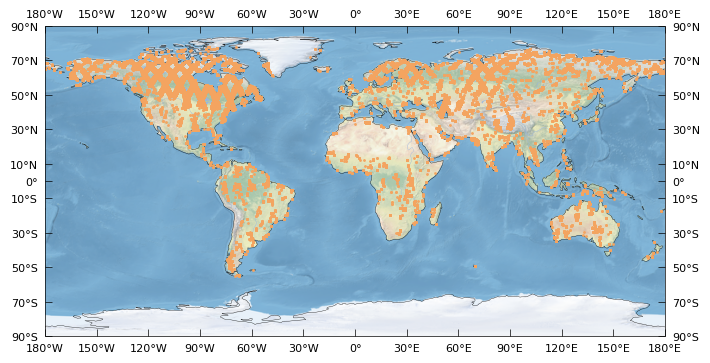

In [6]:
fig = plt.figure(figsize = (8, 6))
crs = ccrs.PlateCarree()
ax = fig.add_subplot(1, 1, 1, projection = crs)
ax.plot(iwDf['longitude'], iwDf['latitude'], 'o', color = 'sandybrown', markersize = 1)
ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
ax.set_xticks([-180, -150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150, 180])
ax.set_yticks([-90, -70, -50, -30, -10, 0, 10, 30, 50, 70, 90])
ax.tick_params(axis = 'both', which = 'major', labelsize = 8, direction = 'in', length = 5, width = 0.5, pad = 5, top = True, right = True, labeltop = True, labelright = True)
ax.spines['geo'].set_linewidth(0.5)

ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE, lw = 0.25)
ax.add_feature(cfeature.RIVERS, lw = 0.25)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.OCEAN)
ax.stock_img()

# ax.set_extent((66.5, 105, 26, 47), crs)
ax.set_extent((-180, 180, -90, 90), crs)
plt.show()

It is pretty explicit that all footprints mainly concentrate in almost all the continents, including Asia, Europe, Africa, and Oceania, North America, and South America. It is still clear that frozen continents, Antarctica and Greenland barely intersect tracks (We note Antarctica and Greenland here because they are also the research hotspot of cryosphere-hydrosphere dynamics internationally). In this tutorial, we solely focus on HMA to reduce product processing time and keep it clear and simplified as best as we can. Therefore, our next step is to see how these footprints disperse in HMA...

C:\Users\60202\AppData\Local\Temp\ipykernel_37092\303028297.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.text(hmaGdf.centroid.x.tolist()[i] - 3, hmaGdf.centroid.y.tolist()[i], hmaGdf['full_name'][i], transform = crs, color = 'black', fontsize = 8, alpha = 0.8)


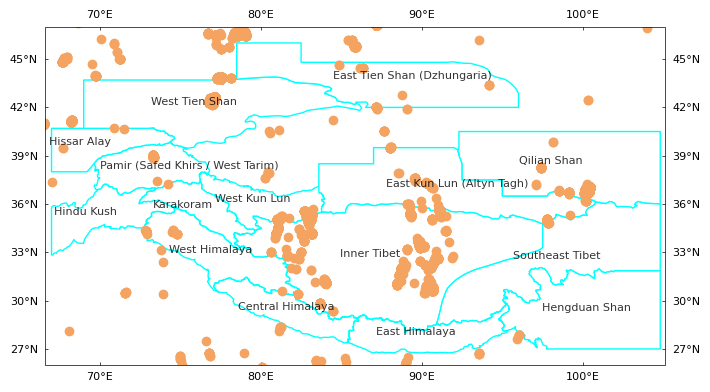

In [7]:
hmaGdf = gpd.read_file(hmaPath)

fig = plt.figure(figsize = (8, 6))
crs = ccrs.PlateCarree()
ax = fig.add_subplot(1, 1, 1, projection = crs)
ax.add_geometries(hmaGdf['geometry'], crs = crs, facecolor = 'white', edgecolor = 'cyan')
for i in range(hmaGdf.shape[0]):
    ax.text(hmaGdf.centroid.x.tolist()[i] - 3, hmaGdf.centroid.y.tolist()[i], hmaGdf['full_name'][i], transform = crs, color = 'black', fontsize = 8, alpha = 0.8)
ax.plot(iwDf['longitude'], iwDf['latitude'], 'o', color = 'sandybrown', markersize = 6)
ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
ax.set_xticks([70, 80, 90, 100])
ax.set_yticks([27, 30, 33, 36, 39, 42, 45])
ax.tick_params(axis = 'both', which = 'major', labelsize = 8, direction = 'in', length = 2, width = 0.5, pad = 5, top = True, right = True, labeltop = True, labelright = True)
ax.spines['geo'].set_linewidth(0.5)

ax.set_extent((66.6, 105.1, 26, 47), crs)
plt.show()

Well, this result looks like not bad in that almost all the subregions of HMA contains footprints more or less in this map, except Hindu Kush, East Himalaya, and Hengduan Shan. So our question is how many footprints located within HMA exactly? And maybe we still want to know how many footprints covered by each subregion. Let us try to dig into it... 

In [8]:
def footprints_count_within_region(fpGdf: str, regionGdf: str, subregionName: str) -> dict:
    '''
    Count footprints number in each subregion of input region file with GeoPandas within method.

    @params:
    fpGdf: input footprints file in the format of GeoDataFrame
    regionGdf: input region file in the format of GeoDataFrame
    subregionName: name of each subregion contained in region GeoDataFrame

    return: dictionary describing the number of footprints calculated within each subregion
    '''
    if not isinstance(fpGdf, gpd.GeoDataFrame):
        raise TypeError(fpGdf, "is not GeoDataFrame type.")
    if not isinstance(regionGdf, gpd.GeoDataFrame):
        raise TypeError(regionGdf, "is not GeoDataFrame type.")
    
    result = {}
    for idx in range(regionGdf.shape[0]):
        regionName = regionGdf.iloc[idx][subregionName][subregionName[0]]
        result[regionName] = np.count_nonzero(fpGdf.within(regionGdf.iloc[idx]['geometry']))
    
    return result

## Convert dataframe into geodataframe firstly
iwGdf = gpd.GeoDataFrame(iwDf, geometry = gpd.points_from_xy(iwDf['longitude'], iwDf['latitude']), crs = "EPSG:4326")

fpStatsDic = footprints_count_within_region(fpGdf = iwGdf, regionGdf = hmaGdf, subregionName = ['full_name'])
fpStatsDic

{'Hissar Alay': 3,
 'Pamir (Safed Khirs / West Tarim)': 92,
 'West Tien Shan': 5239,
 'East Tien Shan (Dzhungaria)': 27,
 'West Kun Lun': 100,
 'East Kun Lun (Altyn Tagh)': 319,
 'Qilian Shan': 3119,
 'Inner Tibet': 1544,
 'Southeast Tibet': 56,
 'Hindu Kush': 0,
 'Karakoram': 0,
 'West Himalaya': 15,
 'Central Himalaya': 0,
 'East Himalaya': 0,
 'Hengduan Shan': 0}

Now, we are much more quantitative that footprints contained in each subregion of HMA. Generally, there are 10514 footprints located within HMA exactly. Let's plot a figure to show them for better comparison...

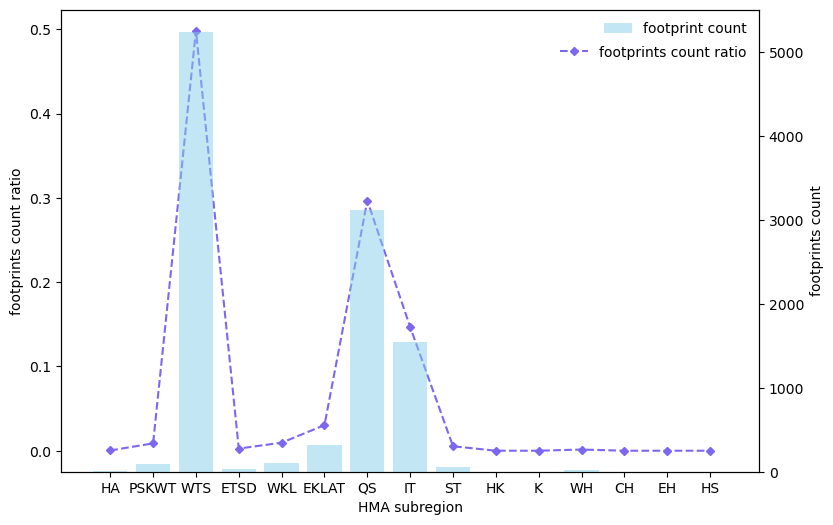

In [9]:
def region_name_rename(strArr: npt.ArrayLike) -> npt.ArrayLike:
    '''
    rename string for plotting

    @param:
    strArr: input str

    return renamed string array
    '''
    if strArr.shape[0] == 0:
        raise ValueError("input string is empty.")
    
    strArr = np.char.replace(np.char.replace(np.char.replace(strArr, '(', ''), ')', ''), '/ ', '')
    for idx in range(strArr.shape[0]):
        strArr[idx] = ''.join([char for char in strArr[idx] if char.isupper()])
        
    return strArr

# idxSeq = [2, 0, 6, 11, 7, 3, 5, 8, 1, 4, 9, 10, 12, 13, 14]
fpKeys = np.array(list(fpStatsDic.keys()))
fpValues = np.array(list(fpStatsDic.values()))
fpValsRatio = fpValues / np.sum(fpValues)
pieExplode = (0.1, 0.02, 0.02, 0.02, 0.02, 0.15, 0.02, 0.15, 0.02, 0, 0, 0, 0, 0, 0)

fpKeys = region_name_rename(strArr = fpKeys)
fig = plt.figure(figsize = (9, 6))
ax1 = fig.add_subplot(1, 1, 1)
ax1.plot(fpKeys, fpValsRatio, 'D--', markersize = 4, color = 'mediumslateblue', label = "footprints count ratio")
ax2 = ax1.twinx()
plt.bar(fpKeys, fpValues, alpha = 0.5, color = 'skyblue', label = 'footprint count')
# ax3 = fig.add_subplot(1, 2, 2)
# ax3.pie(x = fpValsRatio[idxSeq], explode = pieExplode, labels = fpKeys[idxSeq], autopct = '%1.2f%%', labeldistance = 1.2, startangle = 90)
ax1.set_xlabel('HMA subregion')
ax1.set_ylabel('footprints count ratio')
ax2.set_ylabel('footprints count')
ax1.legend(loc = 'upper right', frameon = False, bbox_to_anchor = (1, 0.95))
ax2.legend(loc = 'upper right', frameon = False)

So this figure show that almost 50% footprints located in West Tien Shan and footprints located in Qili Shan and Inner Tibet are also more overwhelming in contrast with remaining subregions. Now, let's see how these footprints disperse in HMA with assistance of Google Earth software and plot their elevations corresponding with latitude and longitude...

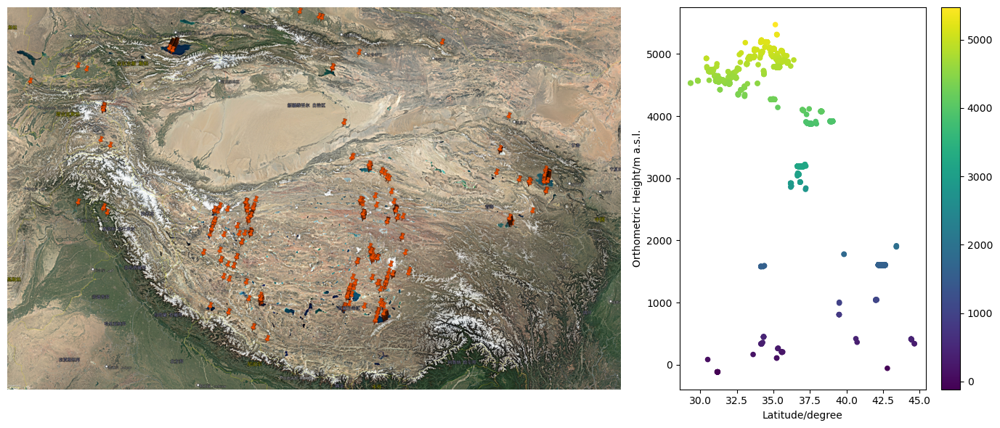

In [10]:
fpHMAFigPath = "D:/Downloads/FDR_IW_HMA_1991.jpg"
fpHMAPath = "D:/Downloads/FGR_ERS1_1991_merge_HMA.geojson"

fpHMAArr = cv2.imread(fpHMAFigPath, cv2.IMREAD_COLOR)[:, :, ::-1]
fpHMAGpd = gpd.read_file(fpHMAPath)
wshHgtEGM2008 = fpHMAGpd['wsh_above_ellipsoid'] - fpHMAGpd['geoid']

fig = plt.figure(figsize = (14, 6))
gs = gridspec.GridSpec(1, 2, width_ratios = [1, 0.5])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

ax1.axis('off')
axPlot1 = ax1.imshow(fpHMAArr)
axPlot2 = ax2.scatter(fpHMAGpd['latitude'], wshHgtEGM2008, c = wshHgtEGM2008, s = 20, marker = 'o', cmap = 'viridis')
ax2.set_xlabel(xlabel = "Latitude/degree")
ax2.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.colorbar(axPlot2, ax = ax2)
plt.tight_layout()
plt.show()

We can see that there are still some spurious footprints (water surface height below 1000 m a.s.l.) contained in HMA of TDP IW product, but it still gives us some hints that most normal footprints fluctuate around 5000 m a.s.l.. Generally, we should go ahead to validate water surface height fidelity with gauge measurements or compared with other water level estimation result like Topex/Poseidon. Nonetheless, ESA has finished these work and more details can be seen from "Validation Report Document Inland Waters TDP", which can be directly retrieved from this website: https://earth.esa.int/eogateway/search?text=fdr4alt&category=data. Therefore, in the next section, we start to randomly select several lakes with different sizes in area to estimate water level variations during specific periods, which is good for us to evaluate TDP IW ERS-1 product quality and also assess the coherent accuracy of water level estimation of this product.

### Water Surface Height Variations

In this section, we have selected three lakes located in HMA to compute water surface height variations of them during specific period. Due to the scarcity of footprints temporally, we solely focus on annual water level fluctuations and do not take into account seasonal water level bias and the effect of frozen ice covered above the lake surface, which can both influence the radar penetration and ice-water volume change. Locations of three selected lakes are shown below...

In [15]:
def track_select(inDir: str, track: list, outDir: str) -> None:
    '''
    select specified track files into another directory

    @params:
    inDir: directory and sub-directory contains *.zip files
    track: chosen track list
    outDir: output directory

    return: None
    '''
    zipStack = glob(inDir + "*.zip") + glob(inDir + "*/*.zip")
    if len(zipStack) == 0:
        raise FileNotFoundError(inDir, "does not contain *.zip files.")
    
    for zip in zipStack:
        zip = os.path.normpath(zip)
        trackNum = os.path.basename(zip).split('_')[6]

        if any(trackNum == trackElem for trackElem in track):
            if os.path.exists(outDir + os.path.basename(zip)):
                continue
            else:
                shutil.move(src = zip, dst = outDir)
        else:
            continue
    
    return None

def unpack_batch(inDir: str, driver: str, outDir: str) -> None:
    '''
    unpack compressed files, like "*.zip", "*.tar.gz", etc. into target directory

    @params:
    inDir: input directory contains compressed files
    driver: compression format represented by filename extension
    outDir: output directory for uncompressed files

    return: None
    '''
    packStack = glob(inDir + "*." + driver) + glob(inDir + "*/*." + driver)
    if len(packStack) == 0:
        raise FileNotFoundError(inDir, "does not contain *.", driver, "file.")
    
    for elem in packStack:
        elem = os.path.normpath(elem)
        if os.path.exists(outDir + os.path.basename(elem).split('.')[0] + ".nc"):
            continue
        else:
            shutil.unpack_archive(filename = elem, extract_dir = outDir, format = driver)
    
    return None

timeStart = np.datetime64('1990-01-01T00:00:00.000000')  # the start time is derived from "time" variable

trackHMA = ['0008', '0010', '0021', '0023', '0038', '0051', '0066', '0079', '0094', '0096', '0107', '0109', '0124', '0137', '0152', '0165', \
            '0180', '0182', '0193', '0195', '0208', '0210', '0221', '0223', '0238', '0251', '0266', '0268', '0279', '0281', '0294', '0296', \
            '0307', '0309', '0324', '0337', '0352', '0354', '0365', '0367', '0380', '0382', '0393', '0395', '0410', '0423', '0438', '0440', \
            '0451', '0453', '0466', '0468', '0479', '0481', '0496', '0509', '0524', '0526', '0537', '0552', '0554', '0565', '0567', '0582', \
            '0595', '0610', '0623', '0638', '0640', '0651', '0653', '0668', '0681', '0696', '0709', '0724', '0726', '0737', '0739', '0752', \
            '0754', '0765', '0767', '0782', '0795', '0810', '0812', '0823', '0825', '0838', '0840', '0851', '0853', '0868', '0881', '0896', \
            '0898', '0909', '0911', '0924', '0926', '0937', '0939', '0954', '0967', '0982', '0995', '0997']
yrList = ['1991', '1992', '1993', '1994', '1995', '1996']

hmaMergeGdf = gpd.read_file(filename = hmaMergePath)

for yr in yrList:
    zipStack = glob(ersFdrDir + yr + "/*.zip")
    if len(zipStack) == 0:
        raise FileNotFoundError(ersFdrDir + yr, "directory does not contain *.zip files.")
    else:
        for zip in zipStack:
            zip = os.path.normpath(zip)
            if os.path.exists(ersFdrDir + yr + "/" + os.path.basename(zip)):
                continue
            else:
                shutil.move(src = zip, dst = ersFdrDir + yr + "/")
    
    if os.path.exists(ersFdrDir + "ERS1_" + yr + "_all_merge.geojson"):
        print(ersFdrDir + "ERS1_" + yr + " directory does not need processing.")
    else:
        unpack_batch(inDir = ersFdrDir + yr + "/", driver = "zip", outDir = ersFdrDir + yr + "/")
        resultDic = fdr_read(ersFdrDir + yr + "/", field = fieldList)
        
        resultDic['time'] = (timeStart + np.timedelta64(1, 'D') * resultDic['time'].astype(np.float64)).astype(str)  # convert seconds to readable time format
        resultDf = pd.DataFrame.from_dict(data = resultDic)
        ## Normalize 'longitude' range
        resultDf.loc[resultDf['longitude'] > 180, 'longitude'] = resultDf[resultDf['longitude'] > 180]['longitude'] - 360
        ## Drop invalid rows with 'wsh_above_ellipsoid' field
        idxWshDrop = list(resultDf[(resultDf['wsh_above_ellipsoid'] < -250) | (resultDf['wsh_above_ellipsoid'] > 8000) | (np.isclose(resultDf['wsh_above_ellipsoid'], 9.969209968386869e+36))].index)
        ## Drop invalid rows with 'wsh_uncertainty'
        idxWshUncDrop = list(resultDf[np.isclose(resultDf['wsh_uncertainty'], 2147483647)].index)
        idxDrop = idxWshDrop + idxWshUncDrop
        resultDf.drop(idxDrop, inplace = True)
        
        resultGdf = gpd.GeoDataFrame.from_dict(data = resultDf, geometry = gpd.points_from_xy(resultDf['longitude'], resultDf['latitude']), crs = "EPSG:4326")
        clipGdf = resultGdf.clip(hmaMergeGdf)
        clipGdf.to_file(filename = ersFdrDir + "ERS1_" + yr + "_all_merge.geojson", driver = "GeoJSON")

E:/GL/South_Lhonak/FDR4ALT/IW/ERS_1/ERS1_1991 directory does not need processing.
E:/GL/South_Lhonak/FDR4ALT/IW/ERS_1/ERS1_1992 directory does not need processing.
E:/GL/South_Lhonak/FDR4ALT/IW/ERS_1/ERS1_1993 directory does not need processing.
E:/GL/South_Lhonak/FDR4ALT/IW/ERS_1/ERS1_1994 directory does not need processing.
E:/GL/South_Lhonak/FDR4ALT/IW/ERS_1/ERS1_1995 directory does not need processing.
E:/GL/South_Lhonak/FDR4ALT/IW/ERS_1/ERS1_1996 directory does not need processing.


So we have acquired all valid altimetry footprints located in HMA during 1991-1996. And, we also find that there are 10514, 21205, 25870, 8717, 18019, and 10837 points for each year, which is sufficient enough for further analysis in this tutorial. Now, we want to see where these footprints situated within HMA...

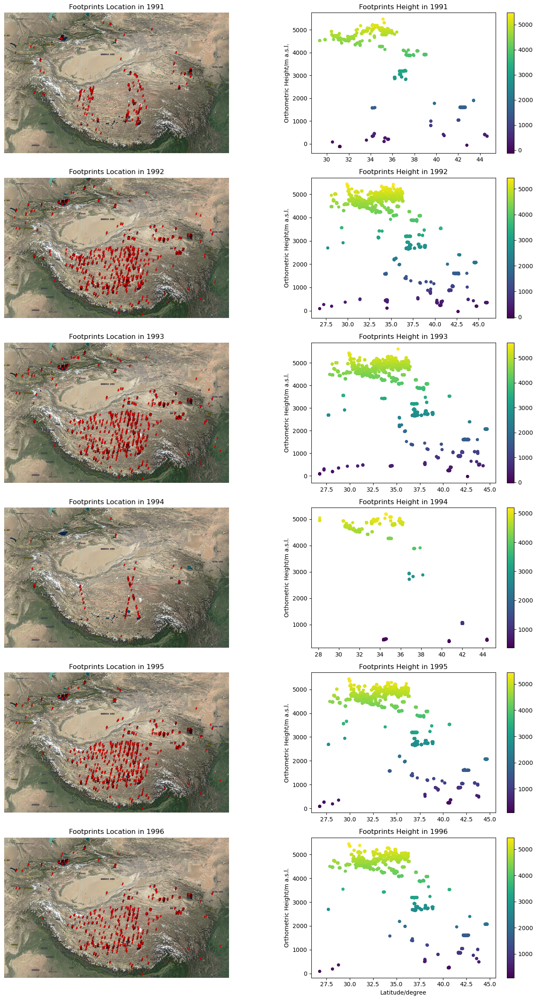

In [29]:
ers1991Jpg = "D:/Downloads/ERS1_HMA_1991.jpg"
ers1991Geojson = "D:/Downloads/ERS1_1991_all_merge.geojson"
ers1992Jpg = "D:/Downloads/ERS1_HMA_1992.jpg"
ers1992Geojson = "D:/Downloads/ERS1_1992_all_merge.geojson"
ers1993Jpg = "D:/Downloads/ERS1_HMA_1993.jpg"
ers1993Geojson = "D:/Downloads/ERS1_1993_all_merge.geojson"
ers1994Jpg = "D:/Downloads/ERS1_HMA_1994.jpg"
ers1994Geojson = "D:/Downloads/ERS1_1994_all_merge.geojson"
ers1995Jpg = "D:/Downloads/ERS1_HMA_1995.jpg"
ers1995Geojson = "D:/Downloads/ERS1_1995_all_merge.geojson"
ers1996Jpg = "D:/Downloads/ERS1_HMA_1996.jpg"
ers1996Geojson = "D:/Downloads/ERS1_1996_all_merge.geojson"

ers1991Arr = cv2.imread(ers1991Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
ers1991Gpd = gpd.read_file(ers1991Geojson)
ers1991OrthoHgt = ers1991Gpd['wsh_above_ellipsoid'] - ers1991Gpd['geoid']
ers1992Arr = cv2.imread(ers1992Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
ers1992Gpd = gpd.read_file(ers1992Geojson)
ers1992OrthoHgt = ers1992Gpd['wsh_above_ellipsoid'] - ers1992Gpd['geoid']
ers1993Arr = cv2.imread(ers1993Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
ers1993Gpd = gpd.read_file(ers1993Geojson)
ers1993OrthoHgt = ers1993Gpd['wsh_above_ellipsoid'] - ers1993Gpd['geoid']
ers1994Arr = cv2.imread(ers1994Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
ers1994Gpd = gpd.read_file(ers1994Geojson)
ers1994OrthoHgt = ers1994Gpd['wsh_above_ellipsoid'] - ers1994Gpd['geoid']
ers1995Arr = cv2.imread(ers1995Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
ers1995Gpd = gpd.read_file(ers1995Geojson)
ers1995OrthoHgt = ers1995Gpd['wsh_above_ellipsoid'] - ers1995Gpd['geoid']
ers1996Arr = cv2.imread(ers1996Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
ers1996Gpd = gpd.read_file(ers1996Geojson)
ers1996OrthoHgt = ers1996Gpd['wsh_above_ellipsoid'] - ers1996Gpd['geoid']

fig = plt.figure(figsize = (16, 24))
gs = gridspec.GridSpec(6, 2, width_ratios = [1, 0.5])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])
ax5 = plt.subplot(gs[4])
ax6 = plt.subplot(gs[5])
ax7 = plt.subplot(gs[6])
ax8 = plt.subplot(gs[7])
ax9 = plt.subplot(gs[8])
ax10 = plt.subplot(gs[9])
ax11 = plt.subplot(gs[10])
ax12 = plt.subplot(gs[11])

ax1.axis('off')
axPlot1 = ax1.imshow(ers1991Arr)
axPlot2 = ax2.scatter(ers1991Gpd['latitude'], ers1991OrthoHgt, c = ers1991OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax2.set_xlabel(xlabel = "Latitude/degree")
ax2.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax1.set_title("Footprints Location in 1991")
ax2.set_title("Footprints Height in 1991")
plt.colorbar(axPlot2, ax = ax2)

ax3.axis('off')
axPlot3 = ax3.imshow(ers1992Arr)
axPlot4 = ax4.scatter(ers1992Gpd['latitude'], ers1992OrthoHgt, c = ers1992OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax4.set_xlabel(xlabel = "Latitude/degree")
ax4.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax3.set_title("Footprints Location in 1992")
ax4.set_title("Footprints Height in 1992")
plt.colorbar(axPlot4, ax = ax4)

ax5.axis('off')
axPlot5 = ax5.imshow(ers1993Arr)
axPlot6 = ax6.scatter(ers1993Gpd['latitude'], ers1993OrthoHgt, c = ers1993OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax6.set_xlabel(xlabel = "Latitude/degree")
ax6.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax5.set_title("Footprints Location in 1993")
ax6.set_title("Footprints Height in 1993")
plt.colorbar(axPlot6, ax = ax6)

ax7.axis('off')
axPlot7 = ax7.imshow(ers1994Arr)
axPlot8 = ax8.scatter(ers1994Gpd['latitude'], ers1994OrthoHgt, c = ers1994OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax8.set_xlabel(xlabel = "Latitude/degree")
ax8.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax7.set_title("Footprints Location in 1994")
ax8.set_title("Footprints Height in 1994")
plt.colorbar(axPlot8, ax = ax8)

ax9.axis('off')
axPlot9 = ax9.imshow(ers1995Arr)
axPlot10 = ax10.scatter(ers1995Gpd['latitude'], ers1995OrthoHgt, c = ers1995OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax10.set_xlabel(xlabel = "Latitude/degree")
ax10.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax9.set_title("Footprints Location in 1995")
ax10.set_title("Footprints Height in 1995")
plt.colorbar(axPlot10, ax = ax10)

ax11.axis('off')
axPlot11 = ax11.imshow(ers1996Arr)
axPlot12 = ax12.scatter(ers1996Gpd['latitude'], ers1996OrthoHgt, c = ers1996OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
ax12.set_xlabel(xlabel = "Latitude/degree")
ax12.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax11.set_title("Footprints Location in 1996")
ax12.set_title("Footprints Height in 1996")
plt.colorbar(axPlot12, ax = ax12)

plt.tight_layout()
plt.show()

It's clear that where and which height these footprints can be in above figure. Based on valid footprints distributions, we opt for Siling Co lake, Duoersuodong Co lake, and lake located around "36.19886°N, 89.03223°E", whose name is not given in associated literatures and databases. These three lakes have varied surface area, which maybe can uncover the influence of area size on water surface height variation estimation. 

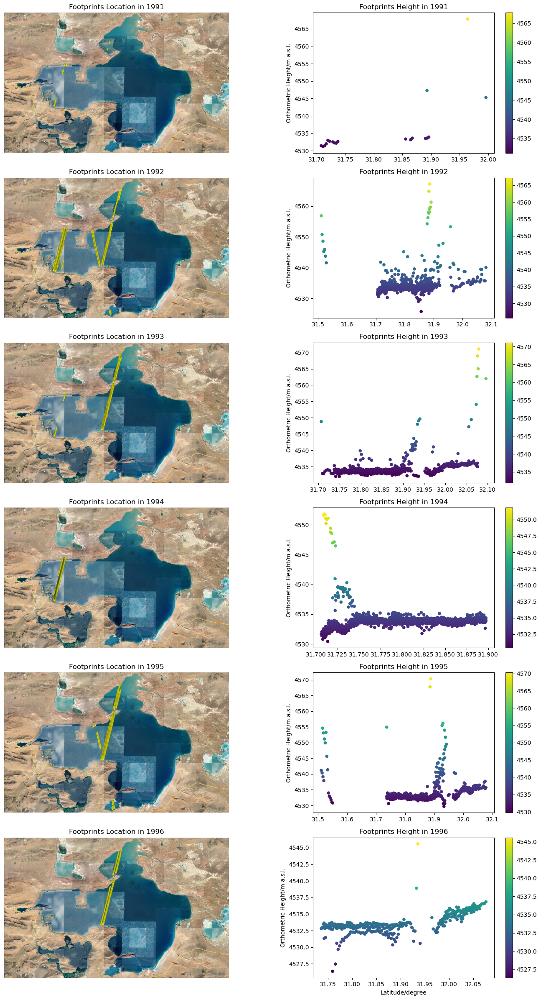

In [49]:
selingco1991Jpg = "D:/Downloads/ERS1_1991_selingco.jpg"
selingco1991Geojson = "D:/Downloads/ERS1_1991_selingco.geojson"
selingco1992Jpg = "D:/Downloads/ERS1_1992_selingco.jpg"
selingco1992Geojson = "D:/Downloads/ERS1_1992_selingco.geojson"
selingco1993Jpg = "D:/Downloads/ERS1_1993_selingco.jpg"
selingco1993Geojson = "D:/Downloads/ERS1_1993_selingco.geojson"
selingco1994Jpg = "D:/Downloads/ERS1_1994_selingco.jpg"
selingco1994Geojson = "D:/Downloads/ERS1_1994_selingco.geojson"
selingco1995Jpg = "D:/Downloads/ERS1_1995_selingco.jpg"
selingco1995Geojson = "D:/Downloads/ERS1_1995_selingco.geojson"
selingco1996Jpg = "D:/Downloads/ERS1_1996_selingco.jpg"
selingco1996Geojson = "D:/Downloads/ERS1_1996_selingco.geojson"

selingco1991Arr = cv2.imread(selingco1991Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
selingco1991Gpd = gpd.read_file(selingco1991Geojson)
selingco1991OrthoHgt = selingco1991Gpd['wsh_above_ellipsoid'] - selingco1991Gpd['geoid']
selingco1992Arr = cv2.imread(selingco1992Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
selingco1992Gpd = gpd.read_file(selingco1992Geojson)
selingco1992OrthoHgt = selingco1992Gpd['wsh_above_ellipsoid'] - selingco1992Gpd['geoid']
selingco1993Arr = cv2.imread(selingco1993Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
selingco1993Gpd = gpd.read_file(selingco1993Geojson)
selingco1993OrthoHgt = selingco1993Gpd['wsh_above_ellipsoid'] - selingco1993Gpd['geoid']
selingco1994Arr = cv2.imread(selingco1994Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
selingco1994Gpd = gpd.read_file(selingco1994Geojson)
selingco1994OrthoHgt = selingco1994Gpd['wsh_above_ellipsoid'] - selingco1994Gpd['geoid']
selingco1995Arr = cv2.imread(selingco1995Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
selingco1995Gpd = gpd.read_file(selingco1995Geojson)
selingco1995OrthoHgt = selingco1995Gpd['wsh_above_ellipsoid'] - selingco1995Gpd['geoid']
selingco1996Arr = cv2.imread(selingco1996Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
selingco1996Gpd = gpd.read_file(selingco1996Geojson)
selingco1996OrthoHgt = selingco1996Gpd['wsh_above_ellipsoid'] - selingco1996Gpd['geoid']

fig = plt.figure(figsize = (16, 24))
gs = gridspec.GridSpec(6, 2, width_ratios = [1, 0.5])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])
ax5 = plt.subplot(gs[4])
ax6 = plt.subplot(gs[5])
ax7 = plt.subplot(gs[6])
ax8 = plt.subplot(gs[7])
ax9 = plt.subplot(gs[8])
ax10 = plt.subplot(gs[9])
ax11 = plt.subplot(gs[10])
ax12 = plt.subplot(gs[11])

ax1.axis('off')
axPlot1 = ax1.imshow(selingco1991Arr)
axPlot2 = ax2.scatter(selingco1991Gpd['latitude'], selingco1991OrthoHgt, c = selingco1991OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax2.set_xlabel(xlabel = "Latitude/degree")
ax2.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax1.set_title("Footprints Location in 1991")
ax2.set_title("Footprints Height in 1991")
plt.colorbar(axPlot2, ax = ax2)

ax3.axis('off')
axPlot3 = ax3.imshow(selingco1992Arr)
axPlot4 = ax4.scatter(selingco1992Gpd['latitude'], selingco1992OrthoHgt, c = selingco1992OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax4.set_xlabel(xlabel = "Latitude/degree")
ax4.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax3.set_title("Footprints Location in 1992")
ax4.set_title("Footprints Height in 1992")
plt.colorbar(axPlot4, ax = ax4)

ax5.axis('off')
axPlot5 = ax5.imshow(selingco1993Arr)
axPlot6 = ax6.scatter(selingco1993Gpd['latitude'], selingco1993OrthoHgt, c = selingco1993OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax6.set_xlabel(xlabel = "Latitude/degree")
ax6.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax5.set_title("Footprints Location in 1993")
ax6.set_title("Footprints Height in 1993")
plt.colorbar(axPlot6, ax = ax6)

ax7.axis('off')
axPlot7 = ax7.imshow(selingco1994Arr)
axPlot8 = ax8.scatter(selingco1994Gpd['latitude'], selingco1994OrthoHgt, c = selingco1994OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax8.set_xlabel(xlabel = "Latitude/degree")
ax8.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax7.set_title("Footprints Location in 1994")
ax8.set_title("Footprints Height in 1994")
plt.colorbar(axPlot8, ax = ax8)

ax9.axis('off')
axPlot9 = ax9.imshow(selingco1995Arr)
axPlot10 = ax10.scatter(selingco1995Gpd['latitude'], selingco1995OrthoHgt, c = selingco1995OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax10.set_xlabel(xlabel = "Latitude/degree")
ax10.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax9.set_title("Footprints Location in 1995")
ax10.set_title("Footprints Height in 1995")
plt.colorbar(axPlot10, ax = ax10)

ax11.axis('off')
axPlot11 = ax11.imshow(selingco1996Arr)
axPlot12 = ax12.scatter(selingco1996Gpd['latitude'], selingco1996OrthoHgt, c = selingco1996OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
ax12.set_xlabel(xlabel = "Latitude/degree")
ax12.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax11.set_title("Footprints Location in 1996")
ax12.set_title("Footprints Height in 1996")
plt.colorbar(axPlot12, ax = ax12)

plt.tight_layout()
plt.show()

The above figure demonstrates that there are 19, 1172, 639, 1713, 727, and 346 footprints in Seling Co lake for each year during 1991-1996, in general, which is suitable for water surface height fluctuations research. Without considering the effects of seasanal variations of water surface height and lake ice appeared in frozon seasons, our estimated result can be reasonably accurate. However, we still notice that footprints there are some "noisy footprints" in each year, thereby we need to take some further actions on these "rogue footprints".

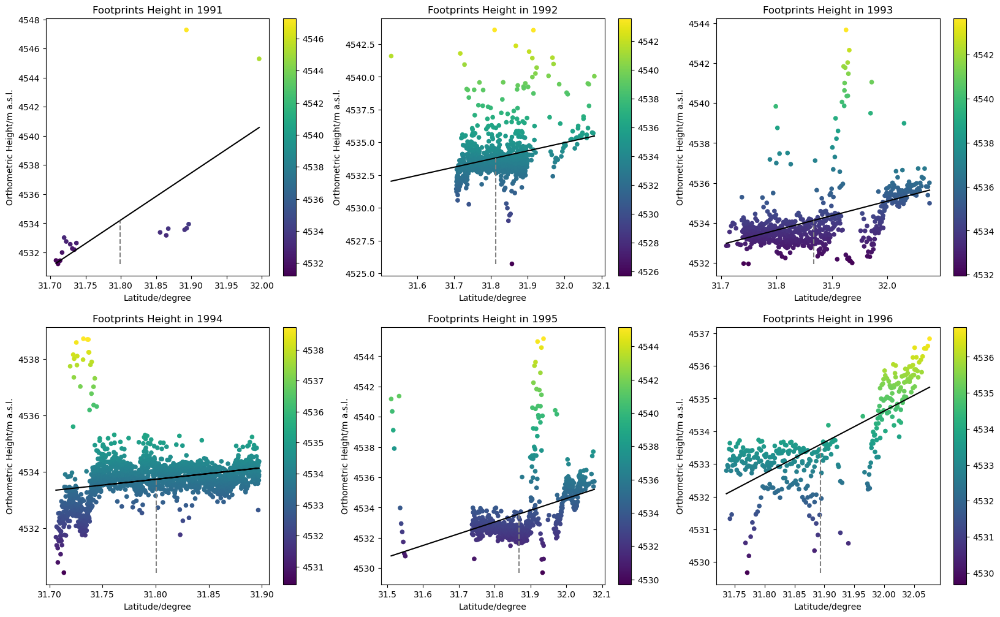

Seling Co lake water surface height in 1991 is: 4534.1906383722935±0.0865611111111111 m a.s.l.
Seling Co lake water surface height in 1992 is: 4533.812543076787±0.07683440486533448 m a.s.l.
Seling Co lake water surface height in 1993 is: 4534.130120112233±0.07286204146730463 m a.s.l.
Seling Co lake water surface height in 1994 is: 4533.743144494482±0.07021896858328393 m a.s.l.
Seling Co lake water surface height in 1995 is: 4533.579108682616±0.0774669014084507 m a.s.l.
Seling Co lake water surface height in 1996 is: 4533.597538972869±0.07536666666666667 m a.s.l.


In [85]:
threshold = 3

selingco1991Zscore = (selingco1991OrthoHgt - np.mean(selingco1991OrthoHgt)) / np.std(selingco1991OrthoHgt)
selingco1992Zscore = (selingco1992OrthoHgt - np.mean(selingco1992OrthoHgt)) / np.std(selingco1992OrthoHgt)
selingco1993Zscore = (selingco1993OrthoHgt - np.mean(selingco1993OrthoHgt)) / np.std(selingco1993OrthoHgt)
selingco1994Zscore = (selingco1994OrthoHgt - np.mean(selingco1994OrthoHgt)) / np.std(selingco1994OrthoHgt)
selingco1995Zscore = (selingco1995OrthoHgt - np.mean(selingco1995OrthoHgt)) / np.std(selingco1995OrthoHgt)
selingco1996Zscore = (selingco1996OrthoHgt - np.mean(selingco1996OrthoHgt)) / np.std(selingco1996OrthoHgt)

selingco1991 = selingco1991Gpd.drop(selingco1991Zscore[(selingco1991Zscore > threshold) | (selingco1991Zscore < -threshold)].index)
selingco1992 = selingco1992Gpd.drop(selingco1992Zscore[(selingco1992Zscore > threshold) | (selingco1992Zscore < -threshold)].index)
selingco1993 = selingco1993Gpd.drop(selingco1993Zscore[(selingco1993Zscore > threshold) | (selingco1993Zscore < -threshold)].index)
selingco1994 = selingco1994Gpd.drop(selingco1994Zscore[(selingco1994Zscore > threshold) | (selingco1994Zscore < -threshold)].index)
selingco1995 = selingco1995Gpd.drop(selingco1995Zscore[(selingco1995Zscore > threshold) | (selingco1995Zscore < -threshold)].index)
selingco1996 = selingco1996Gpd.drop(selingco1996Zscore[(selingco1996Zscore > threshold) | (selingco1996Zscore < -threshold)].index)

fig = plt.figure(figsize = (20, 12))

slope1991, interp1991 = np.polyfit(selingco1991['latitude'], selingco1991['wsh_above_ellipsoid'] - selingco1991['geoid'], 1)
plt.subplot(2, 3, 1)
plt.scatter(selingco1991['latitude'], selingco1991['wsh_above_ellipsoid'] - selingco1991['geoid'], c = selingco1991['wsh_above_ellipsoid'] - selingco1991['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(selingco1991['latitude'], slope1991 * selingco1991['latitude'] + interp1991, color = 'black')
plt.vlines(x = selingco1991['latitude'].mean(), ymin = (selingco1991['wsh_above_ellipsoid'] - selingco1991['geoid']).min(), ymax = slope1991 * selingco1991['latitude'].mean() + interp1991, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1991")

slope1992, interp1992 = np.polyfit(selingco1992['latitude'], selingco1992['wsh_above_ellipsoid'] - selingco1992['geoid'], 1)
plt.subplot(2, 3, 2)
plt.scatter(selingco1992['latitude'], selingco1992['wsh_above_ellipsoid'] - selingco1992['geoid'], c = selingco1992['wsh_above_ellipsoid'] - selingco1992['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(selingco1992['latitude'], slope1992 * selingco1992['latitude'] + interp1992, color = 'black')
plt.vlines(x = selingco1992['latitude'].mean(), ymin = (selingco1992['wsh_above_ellipsoid'] - selingco1992['geoid']).min(), ymax = slope1992 * selingco1992['latitude'].mean() + interp1992, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1992")

slope1993, interp1993 = np.polyfit(selingco1993['latitude'], selingco1993['wsh_above_ellipsoid'] - selingco1993['geoid'], 1)
plt.subplot(2, 3, 3)
plt.scatter(selingco1993['latitude'], selingco1993['wsh_above_ellipsoid'] - selingco1993['geoid'], c = selingco1993['wsh_above_ellipsoid'] - selingco1993['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(selingco1993['latitude'], slope1993 * selingco1993['latitude'] + interp1993, color = 'black')
plt.vlines(x = selingco1993['latitude'].mean(), ymin = (selingco1993['wsh_above_ellipsoid'] - selingco1993['geoid']).min(), ymax = slope1993 * selingco1993['latitude'].mean() + interp1993, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1993")

slope1994, interp1994 = np.polyfit(selingco1994['latitude'], selingco1994['wsh_above_ellipsoid'] - selingco1994['geoid'], 1)
plt.subplot(2, 3, 4)
plt.scatter(selingco1994['latitude'], selingco1994['wsh_above_ellipsoid'] - selingco1994['geoid'], c = selingco1994['wsh_above_ellipsoid'] - selingco1994['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(selingco1994['latitude'], slope1994 * selingco1994['latitude'] + interp1994, color = 'black')
plt.vlines(x = selingco1994['latitude'].mean(), ymin = (selingco1994['wsh_above_ellipsoid'] - selingco1994['geoid']).min(), ymax = slope1994 * selingco1994['latitude'].mean() + interp1994, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1994")

slope1995, interp1995 = np.polyfit(selingco1995['latitude'], selingco1995['wsh_above_ellipsoid'] - selingco1995['geoid'], 1)
plt.subplot(2, 3, 5)
plt.scatter(selingco1995['latitude'], selingco1995['wsh_above_ellipsoid'] - selingco1995['geoid'], c = selingco1995['wsh_above_ellipsoid'] - selingco1995['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(selingco1995['latitude'], slope1995 * selingco1995['latitude'] + interp1995, color = 'black')
plt.vlines(x = selingco1995['latitude'].mean(), ymin = (selingco1995['wsh_above_ellipsoid'] - selingco1995['geoid']).min(), ymax = slope1995 * selingco1995['latitude'].mean() + interp1995, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1995")

slope1996, interp1996 = np.polyfit(selingco1996['latitude'], selingco1996['wsh_above_ellipsoid'] - selingco1996['geoid'], 1)
plt.subplot(2, 3, 6)
plt.scatter(selingco1996['latitude'], selingco1996['wsh_above_ellipsoid'] - selingco1996['geoid'], c = selingco1996['wsh_above_ellipsoid'] - selingco1996['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(selingco1996['latitude'], slope1996 * selingco1996['latitude'] + interp1996, color = 'black')
plt.vlines(x = selingco1996['latitude'].mean(), ymin = (selingco1996['wsh_above_ellipsoid'] - selingco1996['geoid']).min(), ymax = slope1996 * selingco1996['latitude'].mean() + interp1996, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1996")

plt.show()
print("Seling Co lake water surface height in 1991 is:", str(slope1991 * selingco1991['latitude'].mean() + interp1991) + "±" + str(selingco1991['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Seling Co lake water surface height in 1992 is:", str(slope1992 * selingco1992['latitude'].mean() + interp1992) + "±" + str(selingco1992['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Seling Co lake water surface height in 1993 is:", str(slope1993 * selingco1993['latitude'].mean() + interp1993) + "±" + str(selingco1993['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Seling Co lake water surface height in 1994 is:", str(slope1994 * selingco1994['latitude'].mean() + interp1994) + "±" + str(selingco1994['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Seling Co lake water surface height in 1995 is:", str(slope1995 * selingco1995['latitude'].mean() + interp1995) + "±" + str(selingco1995['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Seling Co lake water surface height in 1996 is:", str(slope1996 * selingco1996['latitude'].mean() + interp1996) + "±" + str(selingco1996['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")

Now, we can see that water surface height variations of Seling Co lake during 1991-1996, which shows that its height is 4534.19±0.09 m a.s.l., 4533.81±0.08 m a.s.l., 4534.13±0.07 m a.s.l., 4533.74±0.07 m a.s.l., 4533.58±0.08 m a.s.l., and 4533.60±0.08 m a.s.l. in 1991, 1992, 1993, 1994, 1995, and 1996, respectively.

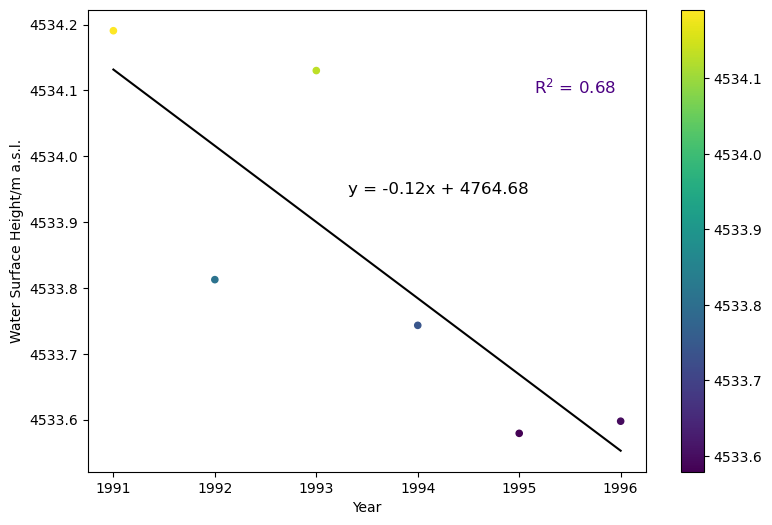

In [112]:
selingcoWsh = np.array([slope1991 * selingco1991['latitude'].mean() + interp1991, slope1992 * selingco1992['latitude'].mean() + interp1992, \
                        slope1993 * selingco1993['latitude'].mean() + interp1993, slope1994 * selingco1994['latitude'].mean() + interp1994, \
                        slope1995 * selingco1995['latitude'].mean() + interp1995, slope1996 * selingco1996['latitude'].mean() + interp1996])

slopeSelingco, interpSelingco, rSelingco, pSelingco, _ = linregress(np.array(yrList, dtype = np.int32), selingcoWsh)
rSquaredSelingco = rSelingco ** 2

fig = plt.figure(figsize = (9, 6))

plt.scatter(yrList, selingcoWsh, c = selingcoWsh, s = 20, marker = 'o', cmap = 'viridis')
plt.plot(yrList, slopeSelingco * np.array(yrList, dtype = np.int32) + interpSelingco, color = 'black')
plt.text(x = 0.7, y = 0.9, s = "R$^{2}$ = " + str(format(rSquaredSelingco, '.2f')), fontsize = 12, color = 'indigo', transform = ax.transAxes)
plt.text(x = 0.4, y = 0.6, s = "y = " + str(format(slopeSelingco, '.2f')) + "x + " + str(format(interpSelingco, '.2f')), fontsize = 12, color = 'black', transform = ax.transAxes)
plt.xlabel('Year')
plt.ylabel('Water Surface Height/m a.s.l.')
plt.colorbar()
plt.show()

Generally speaking, water surface height is fluctuating between 4533.60 m a.s.l. and 4534.19 m a.s.l. and its synoptic trend is decreasing slightly, which is 0.12 m a.s.l. as a whole during 1991-1996. Now, we start to utilize the same strategy to estimate water surface height variations in Duoersuodong Co lake and lake located around "36.19886°N, 89.03223°E"...

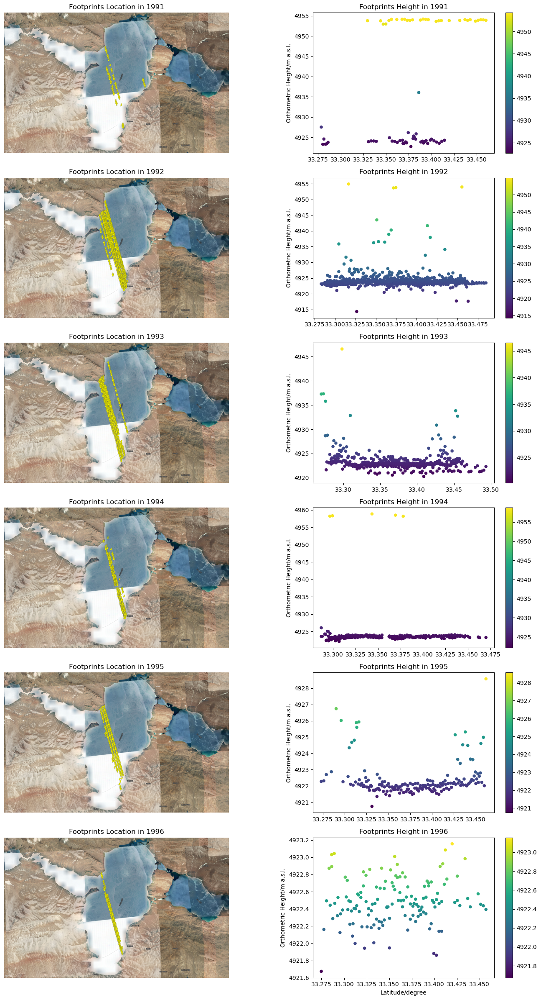

In [113]:
duoersuodongco1991Jpg = "D:/Downloads/ERS1_1991_duoersuodongco.jpg"
duoersuodongco1991Geojson = "D:/Downloads/ERS1_1991_duoersuodongco.geojson"
duoersuodongco1992Jpg = "D:/Downloads/ERS1_1992_duoersuodongco.jpg"
duoersuodongco1992Geojson = "D:/Downloads/ERS1_1992_duoersuodongco.geojson"
duoersuodongco1993Jpg = "D:/Downloads/ERS1_1993_duoersuodongco.jpg"
duoersuodongco1993Geojson = "D:/Downloads/ERS1_1993_duoersuodongco.geojson"
duoersuodongco1994Jpg = "D:/Downloads/ERS1_1994_duoersuodongco.jpg"
duoersuodongco1994Geojson = "D:/Downloads/ERS1_1994_duoersuodongco.geojson"
duoersuodongco1995Jpg = "D:/Downloads/ERS1_1995_duoersuodongco.jpg"
duoersuodongco1995Geojson = "D:/Downloads/ERS1_1995_duoersuodongco.geojson"
duoersuodongco1996Jpg = "D:/Downloads/ERS1_1996_duoersuodongco.jpg"
duoersuodongco1996Geojson = "D:/Downloads/ERS1_1996_duoersuodongco.geojson"

duoersuodongco1991Arr = cv2.imread(duoersuodongco1991Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
duoersuodongco1991Gpd = gpd.read_file(duoersuodongco1991Geojson)
duoersuodongco1991OrthoHgt = duoersuodongco1991Gpd['wsh_above_ellipsoid'] - duoersuodongco1991Gpd['geoid']
duoersuodongco1992Arr = cv2.imread(duoersuodongco1992Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
duoersuodongco1992Gpd = gpd.read_file(duoersuodongco1992Geojson)
duoersuodongco1992OrthoHgt = duoersuodongco1992Gpd['wsh_above_ellipsoid'] - duoersuodongco1992Gpd['geoid']
duoersuodongco1993Arr = cv2.imread(duoersuodongco1993Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
duoersuodongco1993Gpd = gpd.read_file(duoersuodongco1993Geojson)
duoersuodongco1993OrthoHgt = duoersuodongco1993Gpd['wsh_above_ellipsoid'] - duoersuodongco1993Gpd['geoid']
duoersuodongco1994Arr = cv2.imread(duoersuodongco1994Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
duoersuodongco1994Gpd = gpd.read_file(duoersuodongco1994Geojson)
duoersuodongco1994OrthoHgt = duoersuodongco1994Gpd['wsh_above_ellipsoid'] - duoersuodongco1994Gpd['geoid']
duoersuodongco1995Arr = cv2.imread(duoersuodongco1995Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
duoersuodongco1995Gpd = gpd.read_file(duoersuodongco1995Geojson)
duoersuodongco1995OrthoHgt = duoersuodongco1995Gpd['wsh_above_ellipsoid'] - duoersuodongco1995Gpd['geoid']
duoersuodongco1996Arr = cv2.imread(duoersuodongco1996Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
duoersuodongco1996Gpd = gpd.read_file(duoersuodongco1996Geojson)
duoersuodongco1996OrthoHgt = duoersuodongco1996Gpd['wsh_above_ellipsoid'] - duoersuodongco1996Gpd['geoid']

fig = plt.figure(figsize = (16, 24))
gs = gridspec.GridSpec(6, 2, width_ratios = [1, 0.5])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])
ax5 = plt.subplot(gs[4])
ax6 = plt.subplot(gs[5])
ax7 = plt.subplot(gs[6])
ax8 = plt.subplot(gs[7])
ax9 = plt.subplot(gs[8])
ax10 = plt.subplot(gs[9])
ax11 = plt.subplot(gs[10])
ax12 = plt.subplot(gs[11])

ax1.axis('off')
axPlot1 = ax1.imshow(duoersuodongco1991Arr)
axPlot2 = ax2.scatter(duoersuodongco1991Gpd['latitude'], duoersuodongco1991OrthoHgt, c = duoersuodongco1991OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax2.set_xlabel(xlabel = "Latitude/degree")
ax2.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax1.set_title("Footprints Location in 1991")
ax2.set_title("Footprints Height in 1991")
plt.colorbar(axPlot2, ax = ax2)

ax3.axis('off')
axPlot3 = ax3.imshow(duoersuodongco1992Arr)
axPlot4 = ax4.scatter(duoersuodongco1992Gpd['latitude'], duoersuodongco1992OrthoHgt, c = duoersuodongco1992OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax4.set_xlabel(xlabel = "Latitude/degree")
ax4.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax3.set_title("Footprints Location in 1992")
ax4.set_title("Footprints Height in 1992")
plt.colorbar(axPlot4, ax = ax4)

ax5.axis('off')
axPlot5 = ax5.imshow(duoersuodongco1993Arr)
axPlot6 = ax6.scatter(duoersuodongco1993Gpd['latitude'], duoersuodongco1993OrthoHgt, c = duoersuodongco1993OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax6.set_xlabel(xlabel = "Latitude/degree")
ax6.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax5.set_title("Footprints Location in 1993")
ax6.set_title("Footprints Height in 1993")
plt.colorbar(axPlot6, ax = ax6)

ax7.axis('off')
axPlot7 = ax7.imshow(duoersuodongco1994Arr)
axPlot8 = ax8.scatter(duoersuodongco1994Gpd['latitude'], duoersuodongco1994OrthoHgt, c = duoersuodongco1994OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax8.set_xlabel(xlabel = "Latitude/degree")
ax8.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax7.set_title("Footprints Location in 1994")
ax8.set_title("Footprints Height in 1994")
plt.colorbar(axPlot8, ax = ax8)

ax9.axis('off')
axPlot9 = ax9.imshow(duoersuodongco1995Arr)
axPlot10 = ax10.scatter(duoersuodongco1995Gpd['latitude'], duoersuodongco1995OrthoHgt, c = duoersuodongco1995OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax10.set_xlabel(xlabel = "Latitude/degree")
ax10.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax9.set_title("Footprints Location in 1995")
ax10.set_title("Footprints Height in 1995")
plt.colorbar(axPlot10, ax = ax10)

ax11.axis('off')
axPlot11 = ax11.imshow(duoersuodongco1996Arr)
axPlot12 = ax12.scatter(duoersuodongco1996Gpd['latitude'], duoersuodongco1996OrthoHgt, c = duoersuodongco1996OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
ax12.set_xlabel(xlabel = "Latitude/degree")
ax12.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax11.set_title("Footprints Location in 1996")
ax12.set_title("Footprints Height in 1996")
plt.colorbar(axPlot12, ax = ax12)

plt.tight_layout()
plt.show()

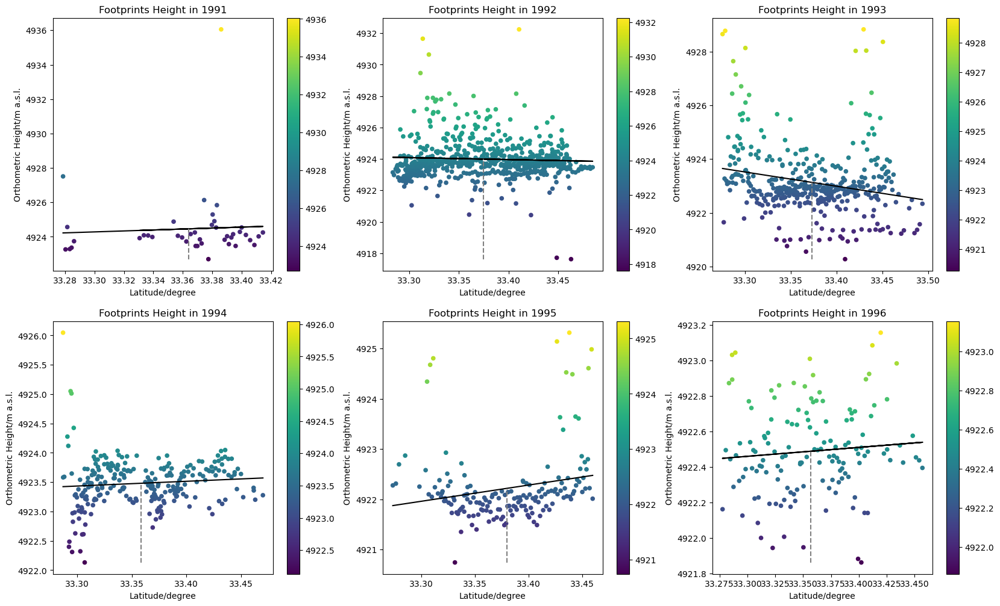

Duoersuodong Co lake water surface height in 1991 is: 4924.4608891407515±0.06921463414634146 m a.s.l.
Duoersuodong Co lake water surface height in 1992 is: 4923.9904453465±0.07268090766823163 m a.s.l.
Duoersuodong Co lake water surface height in 1993 is: 4923.1320474879185±0.07197858942065492 m a.s.l.
Duoersuodong Co lake water surface height in 1994 is: 4923.480937253948±0.07760944881889763 m a.s.l.
Duoersuodong Co lake water surface height in 1995 is: 4922.216539213346±0.06638132530120483 m a.s.l.
Duoersuodong Co lake water surface height in 1996 is: 4922.487799432645±0.07373191489361702 m a.s.l.


In [118]:
duoersuodongco1991Zscore = (duoersuodongco1991OrthoHgt - np.mean(duoersuodongco1991OrthoHgt)) / np.std(duoersuodongco1991OrthoHgt)
duoersuodongco1992Zscore = (duoersuodongco1992OrthoHgt - np.mean(duoersuodongco1992OrthoHgt)) / np.std(duoersuodongco1992OrthoHgt)
duoersuodongco1993Zscore = (duoersuodongco1993OrthoHgt - np.mean(duoersuodongco1993OrthoHgt)) / np.std(duoersuodongco1993OrthoHgt)
duoersuodongco1994Zscore = (duoersuodongco1994OrthoHgt - np.mean(duoersuodongco1994OrthoHgt)) / np.std(duoersuodongco1994OrthoHgt)
duoersuodongco1995Zscore = (duoersuodongco1995OrthoHgt - np.mean(duoersuodongco1995OrthoHgt)) / np.std(duoersuodongco1995OrthoHgt)
duoersuodongco1996Zscore = (duoersuodongco1996OrthoHgt - np.mean(duoersuodongco1996OrthoHgt)) / np.std(duoersuodongco1996OrthoHgt)

duoersuodongco1991 = duoersuodongco1991Gpd.drop(duoersuodongco1991Zscore[(duoersuodongco1991Zscore > threshold) | (duoersuodongco1991Zscore < -threshold) | (duoersuodongco1991OrthoHgt > 4950)].index)
duoersuodongco1992 = duoersuodongco1992Gpd.drop(duoersuodongco1992Zscore[(duoersuodongco1992Zscore > threshold) | (duoersuodongco1992Zscore < -threshold)].index)
duoersuodongco1993 = duoersuodongco1993Gpd.drop(duoersuodongco1993Zscore[(duoersuodongco1993Zscore > threshold) | (duoersuodongco1993Zscore < -threshold)].index)
duoersuodongco1994 = duoersuodongco1994Gpd.drop(duoersuodongco1994Zscore[(duoersuodongco1994Zscore > threshold) | (duoersuodongco1994Zscore < -threshold)].index)
duoersuodongco1995 = duoersuodongco1995Gpd.drop(duoersuodongco1995Zscore[(duoersuodongco1995Zscore > threshold) | (duoersuodongco1995Zscore < -threshold)].index)
duoersuodongco1996 = duoersuodongco1996Gpd.drop(duoersuodongco1996Zscore[(duoersuodongco1996Zscore > threshold) | (duoersuodongco1996Zscore < -threshold)].index)

fig = plt.figure(figsize = (20, 12))

slope1991, interp1991 = np.polyfit(duoersuodongco1991['latitude'], duoersuodongco1991['wsh_above_ellipsoid'] - duoersuodongco1991['geoid'], 1)
plt.subplot(2, 3, 1)
plt.scatter(duoersuodongco1991['latitude'], duoersuodongco1991['wsh_above_ellipsoid'] - duoersuodongco1991['geoid'], c = duoersuodongco1991['wsh_above_ellipsoid'] - duoersuodongco1991['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(duoersuodongco1991['latitude'], slope1991 * duoersuodongco1991['latitude'] + interp1991, color = 'black')
plt.vlines(x = duoersuodongco1991['latitude'].mean(), ymin = (duoersuodongco1991['wsh_above_ellipsoid'] - duoersuodongco1991['geoid']).min(), ymax = slope1991 * duoersuodongco1991['latitude'].mean() + interp1991, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1991")

slope1992, interp1992 = np.polyfit(duoersuodongco1992['latitude'], duoersuodongco1992['wsh_above_ellipsoid'] - duoersuodongco1992['geoid'], 1)
plt.subplot(2, 3, 2)
plt.scatter(duoersuodongco1992['latitude'], duoersuodongco1992['wsh_above_ellipsoid'] - duoersuodongco1992['geoid'], c = duoersuodongco1992['wsh_above_ellipsoid'] - duoersuodongco1992['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(duoersuodongco1992['latitude'], slope1992 * duoersuodongco1992['latitude'] + interp1992, color = 'black')
plt.vlines(x = duoersuodongco1992['latitude'].mean(), ymin = (duoersuodongco1992['wsh_above_ellipsoid'] - duoersuodongco1992['geoid']).min(), ymax = slope1992 * duoersuodongco1992['latitude'].mean() + interp1992, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1992")

slope1993, interp1993 = np.polyfit(duoersuodongco1993['latitude'], duoersuodongco1993['wsh_above_ellipsoid'] - duoersuodongco1993['geoid'], 1)
plt.subplot(2, 3, 3)
plt.scatter(duoersuodongco1993['latitude'], duoersuodongco1993['wsh_above_ellipsoid'] - duoersuodongco1993['geoid'], c = duoersuodongco1993['wsh_above_ellipsoid'] - duoersuodongco1993['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(duoersuodongco1993['latitude'], slope1993 * duoersuodongco1993['latitude'] + interp1993, color = 'black')
plt.vlines(x = duoersuodongco1993['latitude'].mean(), ymin = (duoersuodongco1993['wsh_above_ellipsoid'] - duoersuodongco1993['geoid']).min(), ymax = slope1993 * duoersuodongco1993['latitude'].mean() + interp1993, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1993")

slope1994, interp1994 = np.polyfit(duoersuodongco1994['latitude'], duoersuodongco1994['wsh_above_ellipsoid'] - duoersuodongco1994['geoid'], 1)
plt.subplot(2, 3, 4)
plt.scatter(duoersuodongco1994['latitude'], duoersuodongco1994['wsh_above_ellipsoid'] - duoersuodongco1994['geoid'], c = duoersuodongco1994['wsh_above_ellipsoid'] - duoersuodongco1994['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(duoersuodongco1994['latitude'], slope1994 * duoersuodongco1994['latitude'] + interp1994, color = 'black')
plt.vlines(x = duoersuodongco1994['latitude'].mean(), ymin = (duoersuodongco1994['wsh_above_ellipsoid'] - duoersuodongco1994['geoid']).min(), ymax = slope1994 * duoersuodongco1994['latitude'].mean() + interp1994, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1994")

slope1995, interp1995 = np.polyfit(duoersuodongco1995['latitude'], duoersuodongco1995['wsh_above_ellipsoid'] - duoersuodongco1995['geoid'], 1)
plt.subplot(2, 3, 5)
plt.scatter(duoersuodongco1995['latitude'], duoersuodongco1995['wsh_above_ellipsoid'] - duoersuodongco1995['geoid'], c = duoersuodongco1995['wsh_above_ellipsoid'] - duoersuodongco1995['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(duoersuodongco1995['latitude'], slope1995 * duoersuodongco1995['latitude'] + interp1995, color = 'black')
plt.vlines(x = duoersuodongco1995['latitude'].mean(), ymin = (duoersuodongco1995['wsh_above_ellipsoid'] - duoersuodongco1995['geoid']).min(), ymax = slope1995 * duoersuodongco1995['latitude'].mean() + interp1995, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1995")

slope1996, interp1996 = np.polyfit(duoersuodongco1996['latitude'], duoersuodongco1996['wsh_above_ellipsoid'] - duoersuodongco1996['geoid'], 1)
plt.subplot(2, 3, 6)
plt.scatter(duoersuodongco1996['latitude'], duoersuodongco1996['wsh_above_ellipsoid'] - duoersuodongco1996['geoid'], c = duoersuodongco1996['wsh_above_ellipsoid'] - duoersuodongco1996['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(duoersuodongco1996['latitude'], slope1996 * duoersuodongco1996['latitude'] + interp1996, color = 'black')
plt.vlines(x = duoersuodongco1996['latitude'].mean(), ymin = (duoersuodongco1996['wsh_above_ellipsoid'] - duoersuodongco1996['geoid']).min(), ymax = slope1996 * duoersuodongco1996['latitude'].mean() + interp1996, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1996")

plt.show()
print("Duoersuodong Co lake water surface height in 1991 is:", str(slope1991 * duoersuodongco1991['latitude'].mean() + interp1991) + "±" + str(duoersuodongco1991['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Duoersuodong Co lake water surface height in 1992 is:", str(slope1992 * duoersuodongco1992['latitude'].mean() + interp1992) + "±" + str(duoersuodongco1992['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Duoersuodong Co lake water surface height in 1993 is:", str(slope1993 * duoersuodongco1993['latitude'].mean() + interp1993) + "±" + str(duoersuodongco1993['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Duoersuodong Co lake water surface height in 1994 is:", str(slope1994 * duoersuodongco1994['latitude'].mean() + interp1994) + "±" + str(duoersuodongco1994['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Duoersuodong Co lake water surface height in 1995 is:", str(slope1995 * duoersuodongco1995['latitude'].mean() + interp1995) + "±" + str(duoersuodongco1995['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Duoersuodong Co lake water surface height in 1996 is:", str(slope1996 * duoersuodongco1996['latitude'].mean() + interp1996) + "±" + str(duoersuodongco1996['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")

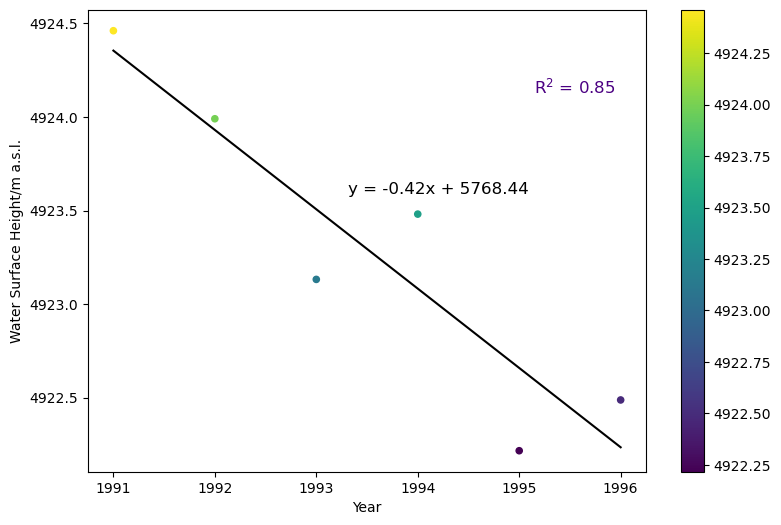

In [119]:
duoersuodongcoWsh = np.array([slope1991 * duoersuodongco1991['latitude'].mean() + interp1991, slope1992 * duoersuodongco1992['latitude'].mean() + interp1992, \
                        slope1993 * duoersuodongco1993['latitude'].mean() + interp1993, slope1994 * duoersuodongco1994['latitude'].mean() + interp1994, \
                        slope1995 * duoersuodongco1995['latitude'].mean() + interp1995, slope1996 * duoersuodongco1996['latitude'].mean() + interp1996])

slopeDuoersuodongco, interpDuoersuodongco, rDuoersuodongco, pDuoersuodongco, _ = linregress(np.array(yrList, dtype = np.int32), duoersuodongcoWsh)
rSquaredDuoersuodongco = rDuoersuodongco ** 2

fig = plt.figure(figsize = (9, 6))

plt.scatter(yrList, duoersuodongcoWsh, c = duoersuodongcoWsh, s = 20, marker = 'o', cmap = 'viridis')
plt.plot(yrList, slopeDuoersuodongco * np.array(yrList, dtype = np.int32) + interpDuoersuodongco, color = 'black')
plt.text(x = 0.7, y = 0.9, s = "R$^{2}$ = " + str(format(rSquaredDuoersuodongco, '.2f')), fontsize = 12, color = 'indigo', transform = ax.transAxes)
plt.text(x = 0.4, y = 0.6, s = "y = " + str(format(slopeDuoersuodongco, '.2f')) + "x + " + str(format(interpDuoersuodongco, '.2f')), fontsize = 12, color = 'black', transform = ax.transAxes)
plt.xlabel('Year')
plt.ylabel('Water Surface Height/m a.s.l.')
plt.colorbar()
plt.show()

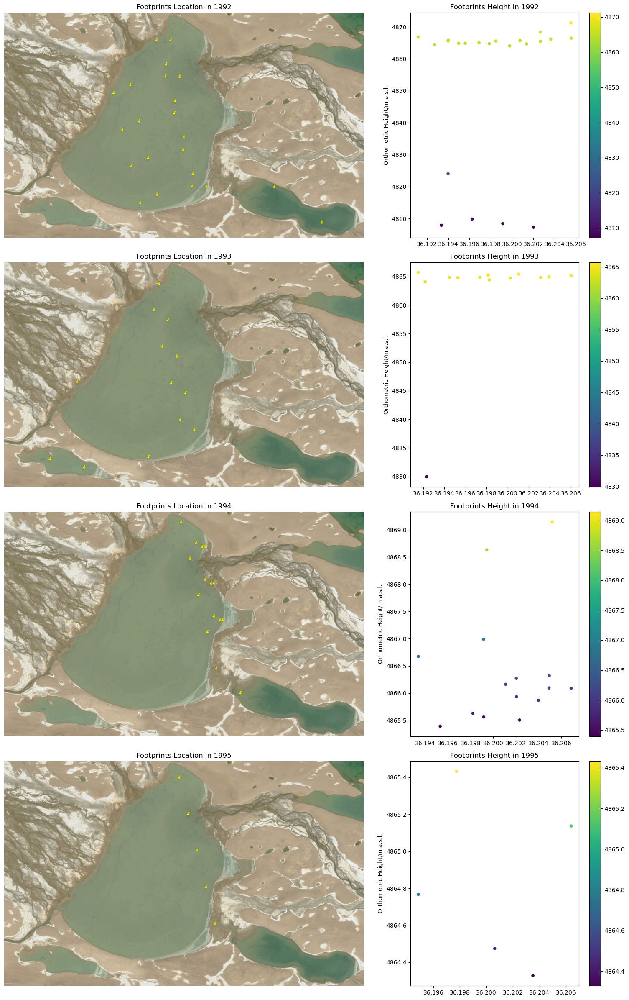

In [120]:
lakeThree1992Jpg = "D:/Downloads/ERS1_1992_lakeThree.jpg"
lakeThree1992Geojson = "D:/Downloads/ERS1_1992_lakeThree.geojson"
lakeThree1993Jpg = "D:/Downloads/ERS1_1993_lakeThree.jpg"
lakeThree1993Geojson = "D:/Downloads/ERS1_1993_lakeThree.geojson"
lakeThree1994Jpg = "D:/Downloads/ERS1_1994_lakeThree.jpg"
lakeThree1994Geojson = "D:/Downloads/ERS1_1994_lakeThree.geojson"
lakeThree1995Jpg = "D:/Downloads/ERS1_1995_lakeThree.jpg"
lakeThree1995Geojson = "D:/Downloads/ERS1_1995_lakeThree.geojson"

lakeThree1992Arr = cv2.imread(lakeThree1992Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
lakeThree1992Gpd = gpd.read_file(lakeThree1992Geojson)
lakeThree1992OrthoHgt = lakeThree1992Gpd['wsh_above_ellipsoid'] - lakeThree1992Gpd['geoid']
lakeThree1993Arr = cv2.imread(lakeThree1993Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
lakeThree1993Gpd = gpd.read_file(lakeThree1993Geojson)
lakeThree1993OrthoHgt = lakeThree1993Gpd['wsh_above_ellipsoid'] - lakeThree1993Gpd['geoid']
lakeThree1994Arr = cv2.imread(lakeThree1994Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
lakeThree1994Gpd = gpd.read_file(lakeThree1994Geojson)
lakeThree1994OrthoHgt = lakeThree1994Gpd['wsh_above_ellipsoid'] - lakeThree1994Gpd['geoid']
lakeThree1995Arr = cv2.imread(lakeThree1995Jpg, cv2.IMREAD_COLOR)[:, :, ::-1]
lakeThree1995Gpd = gpd.read_file(lakeThree1995Geojson)
lakeThree1995OrthoHgt = lakeThree1995Gpd['wsh_above_ellipsoid'] - lakeThree1995Gpd['geoid']

fig = plt.figure(figsize = (16, 24))
gs = gridspec.GridSpec(4, 2, width_ratios = [1, 0.5])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])
ax5 = plt.subplot(gs[4])
ax6 = plt.subplot(gs[5])
ax7 = plt.subplot(gs[6])
ax8 = plt.subplot(gs[7])

ax1.axis('off')
axPlot1 = ax1.imshow(lakeThree1992Arr)
axPlot2 = ax2.scatter(lakeThree1992Gpd['latitude'], lakeThree1992OrthoHgt, c = lakeThree1992OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax2.set_xlabel(xlabel = "Latitude/degree")
ax2.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax1.set_title("Footprints Location in 1992")
ax2.set_title("Footprints Height in 1992")
plt.colorbar(axPlot2, ax = ax2)

ax3.axis('off')
axPlot3 = ax3.imshow(lakeThree1993Arr)
axPlot4 = ax4.scatter(lakeThree1993Gpd['latitude'], lakeThree1993OrthoHgt, c = lakeThree1993OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax4.set_xlabel(xlabel = "Latitude/degree")
ax4.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax3.set_title("Footprints Location in 1993")
ax4.set_title("Footprints Height in 1993")
plt.colorbar(axPlot4, ax = ax4)

ax5.axis('off')
axPlot5 = ax5.imshow(lakeThree1994Arr)
axPlot6 = ax6.scatter(lakeThree1994Gpd['latitude'], lakeThree1994OrthoHgt, c = lakeThree1994OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax6.set_xlabel(xlabel = "Latitude/degree")
ax6.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax5.set_title("Footprints Location in 1994")
ax6.set_title("Footprints Height in 1994")
plt.colorbar(axPlot6, ax = ax6)

ax7.axis('off')
axPlot7 = ax7.imshow(lakeThree1995Arr)
axPlot8 = ax8.scatter(lakeThree1995Gpd['latitude'], lakeThree1995OrthoHgt, c = lakeThree1995OrthoHgt, s = 20, marker = 'o', cmap = 'viridis')
# ax8.set_xlabel(xlabel = "Latitude/degree")
ax8.set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
ax7.set_title("Footprints Location in 1995")
ax8.set_title("Footprints Height in 1995")
plt.colorbar(axPlot8, ax = ax8)

plt.tight_layout()
plt.show()

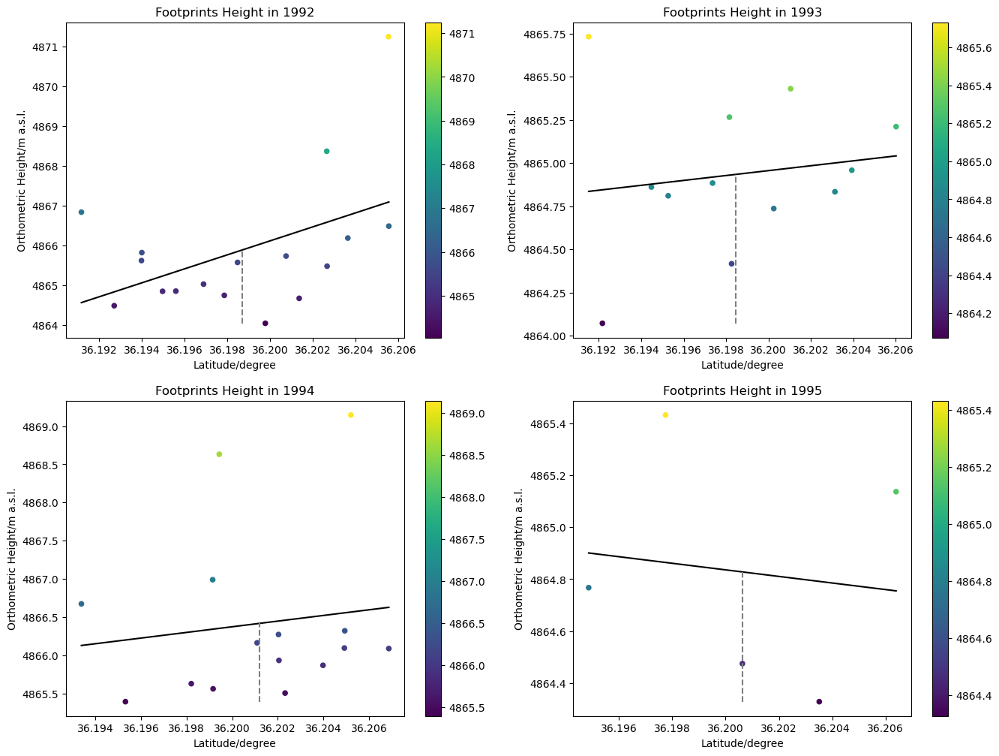

Lake Three water surface height in 1992 is: 4865.883947386991±0.14516470588235295 m a.s.l.
Lake Three water surface height in 1993 is: 4864.934094572342±0.08706666666666667 m a.s.l.
Lake Three water surface height in 1994 is: 4866.418233137096±0.07008666666666667 m a.s.l.
Lake Three water surface height in 1995 is: 4864.82776791284±0.0799 m a.s.l.


In [123]:
lakeThree1992Zscore = (lakeThree1992OrthoHgt - np.mean(lakeThree1992OrthoHgt)) / np.std(lakeThree1992OrthoHgt)
lakeThree1993Zscore = (lakeThree1993OrthoHgt - np.mean(lakeThree1993OrthoHgt)) / np.std(lakeThree1993OrthoHgt)
lakeThree1994Zscore = (lakeThree1994OrthoHgt - np.mean(lakeThree1994OrthoHgt)) / np.std(lakeThree1994OrthoHgt)
lakeThree1995Zscore = (lakeThree1995OrthoHgt - np.mean(lakeThree1995OrthoHgt)) / np.std(lakeThree1995OrthoHgt)

lakeThree1992 = lakeThree1992Gpd.drop(lakeThree1992Zscore[(lakeThree1992Zscore > threshold) | (lakeThree1992Zscore < -threshold) | (lakeThree1992OrthoHgt < 4840)].index)
lakeThree1993 = lakeThree1993Gpd.drop(lakeThree1993Zscore[(lakeThree1993Zscore > threshold) | (lakeThree1993Zscore < -threshold) | (lakeThree1993OrthoHgt < 4840)].index)
lakeThree1994 = lakeThree1994Gpd.drop(lakeThree1994Zscore[(lakeThree1994Zscore > threshold) | (lakeThree1994Zscore < -threshold)].index)
lakeThree1995 = lakeThree1995Gpd.drop(lakeThree1995Zscore[(lakeThree1995Zscore > threshold) | (lakeThree1995Zscore < -threshold)].index)

fig = plt.figure(figsize = (16, 12))

slope1992, interp1992 = np.polyfit(lakeThree1992['latitude'], lakeThree1992['wsh_above_ellipsoid'] - lakeThree1992['geoid'], 1)
plt.subplot(2, 2, 1)
plt.scatter(lakeThree1992['latitude'], lakeThree1992['wsh_above_ellipsoid'] - lakeThree1992['geoid'], c = lakeThree1992['wsh_above_ellipsoid'] - lakeThree1992['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(lakeThree1992['latitude'], slope1992 * lakeThree1992['latitude'] + interp1992, color = 'black')
plt.vlines(x = lakeThree1992['latitude'].mean(), ymin = (lakeThree1992['wsh_above_ellipsoid'] - lakeThree1992['geoid']).min(), ymax = slope1992 * lakeThree1992['latitude'].mean() + interp1992, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1992")

slope1993, interp1993 = np.polyfit(lakeThree1993['latitude'], lakeThree1993['wsh_above_ellipsoid'] - lakeThree1993['geoid'], 1)
plt.subplot(2, 2, 2)
plt.scatter(lakeThree1993['latitude'], lakeThree1993['wsh_above_ellipsoid'] - lakeThree1993['geoid'], c = lakeThree1993['wsh_above_ellipsoid'] - lakeThree1993['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(lakeThree1993['latitude'], slope1993 * lakeThree1993['latitude'] + interp1993, color = 'black')
plt.vlines(x = lakeThree1993['latitude'].mean(), ymin = (lakeThree1993['wsh_above_ellipsoid'] - lakeThree1993['geoid']).min(), ymax = slope1993 * lakeThree1993['latitude'].mean() + interp1993, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1993")

slope1994, interp1994 = np.polyfit(lakeThree1994['latitude'], lakeThree1994['wsh_above_ellipsoid'] - lakeThree1994['geoid'], 1)
plt.subplot(2, 2, 3)
plt.scatter(lakeThree1994['latitude'], lakeThree1994['wsh_above_ellipsoid'] - lakeThree1994['geoid'], c = lakeThree1994['wsh_above_ellipsoid'] - lakeThree1994['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(lakeThree1994['latitude'], slope1994 * lakeThree1994['latitude'] + interp1994, color = 'black')
plt.vlines(x = lakeThree1994['latitude'].mean(), ymin = (lakeThree1994['wsh_above_ellipsoid'] - lakeThree1994['geoid']).min(), ymax = slope1994 * lakeThree1994['latitude'].mean() + interp1994, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1994")

slope1995, interp1995 = np.polyfit(lakeThree1995['latitude'], lakeThree1995['wsh_above_ellipsoid'] - lakeThree1995['geoid'], 1)
plt.subplot(2, 2, 4)
plt.scatter(lakeThree1995['latitude'], lakeThree1995['wsh_above_ellipsoid'] - lakeThree1995['geoid'], c = lakeThree1995['wsh_above_ellipsoid'] - lakeThree1995['geoid'], s = 20, marker = 'o', cmap = 'viridis')
plt.plot(lakeThree1995['latitude'], slope1995 * lakeThree1995['latitude'] + interp1995, color = 'black')
plt.vlines(x = lakeThree1995['latitude'].mean(), ymin = (lakeThree1995['wsh_above_ellipsoid'] - lakeThree1995['geoid']).min(), ymax = slope1995 * lakeThree1995['latitude'].mean() + interp1995, colors = 'gray', linestyles = 'dashed')
plt.colorbar()
plt.xlabel(xlabel = "Latitude/degree")
plt.ylabel(ylabel = "Orthometric Height/m a.s.l.")
plt.title("Footprints Height in 1995")

plt.show()
print("Lake Three water surface height in 1992 is:", str(slope1992 * lakeThree1992['latitude'].mean() + interp1992) + "±" + str(lakeThree1992['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Lake Three water surface height in 1993 is:", str(slope1993 * lakeThree1993['latitude'].mean() + interp1993) + "±" + str(lakeThree1993['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Lake Three water surface height in 1994 is:", str(slope1994 * lakeThree1994['latitude'].mean() + interp1994) + "±" + str(lakeThree1994['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")
print("Lake Three water surface height in 1995 is:", str(slope1995 * lakeThree1995['latitude'].mean() + interp1995) + "±" + str(lakeThree1995['wsh_uncertainty'].mean() * 0.01),"m a.s.l.")

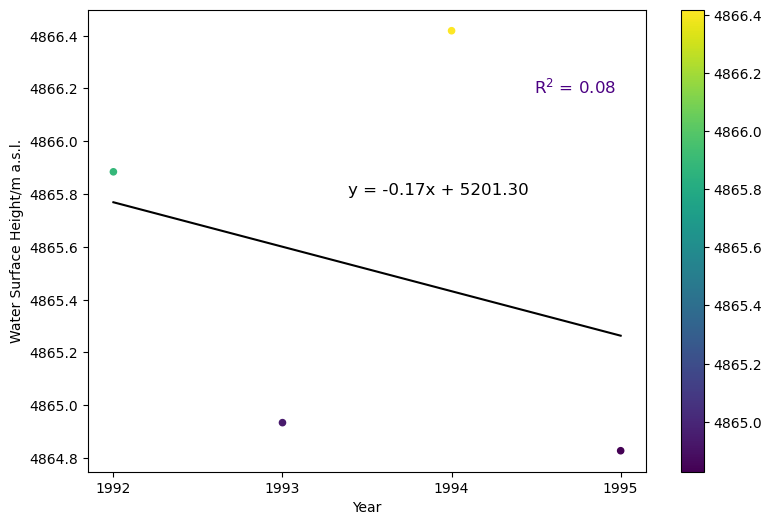

In [124]:
lakeThreeWsh = np.array([slope1992 * lakeThree1992['latitude'].mean() + interp1992, slope1993 * lakeThree1993['latitude'].mean() + interp1993, \
                         slope1994 * lakeThree1994['latitude'].mean() + interp1994, slope1995 * lakeThree1995['latitude'].mean() + interp1995])

slopeLakeThree, interpLakeThree, rLakeThree, pLakeThree, _ = linregress(np.array(yrList[1:5], dtype = np.int32), lakeThreeWsh)
rSquaredLakeThree = rLakeThree ** 2

fig = plt.figure(figsize = (9, 6))

plt.scatter(yrList[1:5], lakeThreeWsh, c = lakeThreeWsh, s = 20, marker = 'o', cmap = 'viridis')
plt.plot(yrList[1:5], slopeLakeThree * np.array(yrList[1:5], dtype = np.int32) + interpLakeThree, color = 'black')
plt.text(x = 0.7, y = 0.9, s = "R$^{2}$ = " + str(format(rSquaredLakeThree, '.2f')), fontsize = 12, color = 'indigo', transform = ax.transAxes)
plt.text(x = 0.4, y = 0.6, s = "y = " + str(format(slopeLakeThree, '.2f')) + "x + " + str(format(interpLakeThree, '.2f')), fontsize = 12, color = 'black', transform = ax.transAxes)
plt.xlabel('Year')
plt.ylabel('Water Surface Height/m a.s.l.')
plt.colorbar()
plt.show()

Here, we have processed all three lakes and computed their surface height oscillations during 1991-1996. In general, Seling Co lake, Duoersuodong Co lake, and lake located around "36.19886°N, 89.03223°E" were all experiencing a decreasing trend in this period with high confidence (R² > 0.6) except lake located around "36.19886°N, 89.03223°E", which is probably its smaller area size and limited footprints within its boundary (R² = 0.08). Specifically, Duoersuodong Co lake surface height was 4924.46±0.07 m a.s.l., 4923.99±0.07 m a.s.l., 4923.13±0.07 m a.s.l., 4923.48±0.08 m a.s.l., 4922.22±0.07 m a.s.l., and 4922.49±0.07 m a.s.l., in 1991, 1992, 1993, 1994, 1995, and 1996, respectively. With respect to lake sat around "36.19886°N, 89.03223°E", its surface height dropped from 4865.88±0.15 m a.s.l. to 4864.93±0.09 m a.s.l. and then climbed to 4866.42±0.07 m a.s.l. during 1992-1994, followed by declining again, to 4864.83±0.08 m a.s.l. in 1995.

### Conclusions

To conclude, in this tutorial we have leveraged TDP inland water product to estimate water level fluctuations in Seling Co lake, Duoersuodong Co lake, and lake situated around "36.19886°N, 89.03223°E", which all showed decreasing water level and their corresponding decreasing trend is 0.12 m a.s.l./yr, 0.42 m a.s.l./yr, and 0.17 m a.s.l./yr during 1991-1996, 1991-1996, and 1992-1995, respectively.

However, there are still some drawbacks. Firstly, ERS-1 radar altimeter operated in a short duration (1991-1996), thereby confines the analysis of water level variation research in a long term (i.e., two decades). Secondly, we do not validate our calculated inland water level results with gauge measurements owing to the dearth of in-situ databases in these high mountainous regions or compared with water level results estimated by laser altimeters due to the time gap between ERS-1 and ICESat or ICESat-2, which ought to be a necessary part in formal academic publications. Thirdly, we do not consider the effects of water surface height seasonal variations, lake ice covered above lakes and radar penetrations through lake ice in frozen seasons, but our estimated water surface height variations outcome of three lakes with dissimilar area size in HMA during specific comparatively short period (1991-1996) with specific sensor-ERS-1 radar altimeter, which is characterized with a decline water level trend commencing from 1991 to mid-1990s, coincides with previous researches (Zhang et al., 2020). In general, this tutorial proved high fidelity of ERS-1 TDP product application in inland lake water level fluctuation domain notwithstanding with some limitations.